In [1]:
import os
import json
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from datetime import datetime
from scipy import stats
import itertools

pd.set_option('display.max_columns', 500)

In [2]:
def parse_methods(compression_data):
    """Парсим методы компрессии и их параметры в строковое представление"""
    params = []
    methods_names = []
    for method_name in compression_data['order']:
        param = compression_data[method_name]
        param_strs = []
        for k, v in param.items():
            if isinstance(v, bool):
                v = str(v).lower()
            param_strs.append(f"{k}={v}")
        params.append(f"{', '.join(param_strs)}")
        methods_names.append(method_name)
    return " → ".join(methods_names), " → ".join(params)

def parse_filename(filename):
    """Парсим название файла и извлекаем model_name, seed и timestamp"""
    parts = filename.split('_')
    model_parts = []
    seed = None
    timestamp_str = None
    
    # Ищем seed (первое число после имени модели)
    for i, part in enumerate(parts[1:], 1):
        if part.isdigit():
            seed = int(part)
            model_name = '_'.join(parts[:i])
            timestamp_str = '_'.join(parts[i+1:]).replace('.json', '')
            break
    
    # Парсим timestamp (формат YYYYMMDD_HHMMSS)
    timestamp = None
    if timestamp_str:
        try:
            dt = datetime.strptime(timestamp_str, "%Y%m%d_%H%M%S")
            timestamp = dt.strftime("%Y-%m-%d %H:%M:%S")
        except ValueError:
            pass
    
    return model_name, seed, timestamp

def process_results_directory(root_dir="results"):
    data = []
    
    for root, dirs, files in os.walk(root_dir):
        for file in files:
            if file.endswith('.json'):
                file_path = os.path.join(root, file)
                try:
                    with open(file_path, 'r') as f:
                        experiment = json.load(f)
                    
                    # Парсим имя файла
                    model_name_from_file, seed, timestamp = parse_filename(file)
                    
                    # Проверяем соответствие model_name в файле и в названии
                    model_name_in_json = experiment['parameters']['model']
                    if model_name_from_file != model_name_in_json:
                        print(f"Warning: Model name mismatch in {file}: "
                              f"file suggests '{model_name_from_file}', "
                              f"JSON contains '{model_name_in_json}'")
                    
                    # Используем model_name из JSON как более надежный источник
                    model_name = model_name_in_json
                    method_name, method_str = parse_methods(experiment['parameters']['compression'])
                    
                    # Создаем запись для DataFrame
                    record = {
                        'model': model_name,
                        'method_name':method_name,
                        'method': method_str,
                        'seed': seed,
                        'timestamp': timestamp,
                        'filename': file,
                    }
                    
                    # Добавляем метрики
                    for category in ['baseline', 'compressed', 'comparison']:
                        if category in experiment['results']:
                            for metric, value in experiment['results'][category].items():
                                record[f"{category}_{metric}"] = value
                    
                    data.append(record)
                
                except Exception as e:
                    print(f"Error processing {file_path}: {str(e)}")
    
    return pd.DataFrame(data)

In [ ]:
df = process_results_directory("../results")

df['diff_size'] = df['baseline_model_size_mb'] - df['compressed_model_size_mb']
df['diff_perplexity'] = df['baseline_perplexity'] - df['compressed_perplexity']
df['diff_latency'] = df['baseline_latency'] - df['compressed_latency']
df['diff_total_params'] = df['baseline_total_params'] - df['compressed_total_params']
df['diff_sparsity'] = df['baseline_sparsity'] - df['compressed_sparsity']
df['diff_unique_weights'] = df['baseline_unique_weights'] - df['compressed_unique_weights']

# df.to_csv('compression_results.csv', index=False)

print(df.shape)
df.head()

(1213, 36)


,model,method_name,method,seed,timestamp,filename,baseline_perplexity,baseline_latency,baseline_model_size_mb,baseline_total_params,baseline_nonzero_params,baseline_sparsity,baseline_weight_min,baseline_weight_max,baseline_weight_mean,baseline_weight_std,baseline_unique_weights,compressed_perplexity,compressed_latency,compressed_model_size_mb,compressed_total_params,compressed_nonzero_params,compressed_sparsity,compressed_weight_min,compressed_weight_max,compressed_weight_mean,compressed_weight_std,compressed_unique_weights,comparison_cosine_similarity,comparison_mse,diff_size,diff_perplexity,diff_latency,diff_total_params,diff_sparsity,diff_unique_weights
0,roberta-large,weight_sharing,"algorithm=kmeans, layers=[], n_clusters=32",50,2025-05-28 16:31:32,roberta-large_50_20250528_163132.json,3.949271,0.194593,1355.797245,355088384,355087158,0.000005,-1.005859,1.00293,-0.001732,0.065709,7428,4.276942,0.182812,1355.797245,355088384,355087360,0.000004,-1.000000,1.002930,-0.001730,0.065667,6737,0.990170,0.019234,0.000000,-0.327671,0.011781,0,5.683544e-07,691
1,roberta-large,low_rank_factorization,"ff_ratio=0.95, min_ff_rank=128",505,2025-05-28 19:20:59,roberta-large_505_20250528_192059.json,3.949271,0.194593,1355.797245,355088384,355087158,0.000005,-1.005859,1.00293,-0.001732,0.065709,7428,48005.715720,0.207159,1493.355839,391148544,391147467,0.000004,-5.648140,5.033745,-0.002268,0.063697,20531,0.918842,0.158873,-137.558594,-48001.766449,-0.012566,-36060160,7.963326e-07,-13103
2,roberta-large,weight_sharing → quantization,"algorithm=kmeans, layers=[], n_clusters=64 → t...",50,2025-05-31 04:16:35,roberta-large_50_20250531_041635.json,3.949271,0.194593,1355.797245,355088384,355087158,0.000005,-1.005859,1.00293,-0.001732,0.065709,7428,5.558565,0.106196,198.949589,52049920,52048896,0.001506,-0.599121,1.002930,-0.016948,0.138752,6395,0.966245,0.066039,1156.847656,-1.609294,0.088397,303038464,-1.501314e-03,1033
3,roberta-large,low_rank_factorization,"ff_ratio=0.99, min_ff_rank=128",505,2025-05-28 19:35:20,roberta-large_505_20250528_193520.json,3.949271,0.194593,1355.797245,355088384,355087158,0.000005,-1.005859,1.00293,-0.001732,0.065709,7428,51440.178036,0.220075,1594.433964,417645568,417644490,0.000003,-5.648140,5.033745,-0.002124,0.061907,20531,0.920662,0.155319,-238.636719,-51436.228765,-0.025481,-62557184,1.029562e-06,-13103
4,roberta-large,low_rank_factorization,"ff_ratio=0.97, min_ff_rank=128",5,2025-05-28 19:23:24,roberta-large_5_20250528_192324.json,3.949271,0.194593,1355.797245,355088384,355087158,0.000005,-1.005859,1.00293,-0.001732,0.065709,7428,27555.409393,0.211836,1539.348026,403205120,403204043,0.000004,-5.648140,5.033745,-0.002200,0.062867,20531,0.921813,0.153067,-183.550781,-27551.460122,-0.017243,-48116736,9.073808e-07,-13103


In [16]:
df.columns

Index(['model', 'method_name', 'method', 'seed', 'timestamp', 'filename',
       'baseline_perplexity', 'baseline_latency', 'baseline_model_size_mb',
       'baseline_total_params', 'baseline_nonzero_params', 'baseline_sparsity',
       'baseline_weight_min', 'baseline_weight_max', 'baseline_weight_mean',
       'baseline_weight_std', 'baseline_unique_weights',
       'compressed_perplexity', 'compressed_latency',
       'compressed_model_size_mb', 'compressed_total_params',
       'compressed_nonzero_params', 'compressed_sparsity',
       'compressed_weight_min', 'compressed_weight_max',
       'compressed_weight_mean', 'compressed_weight_std',
       'compressed_unique_weights', 'comparison_cosine_similarity',
       'comparison_mse', 'diff_size', 'diff_perplexity', 'diff_latency',
       'diff_total_params', 'diff_sparsity', 'diff_unique_weights'],
      dtype='object')

In [17]:
sum(df.drop(columns=['timestamp', 'filename', 'diff_latency']).duplicated())

0

## Оценка вариативности методов

Size (1138, 36)
pruning: p-value = 0.9703
quantization: p-value = 1.0000
weight_sharing: p-value = 0.9944
low_rank_factorization: p-value = 1.0000
activation_approximation: p-value = 1.0000
pruning → quantization: p-value = 1.0000
quantization → pruning: p-value = 1.0000
weight_sharing → quantization: p-value = 0.9982
quantization → weight_sharing: p-value = 1.0000
weight_sharing → pruning: p-value = 0.9999
pruning → weight_sharing: p-value = 0.9996


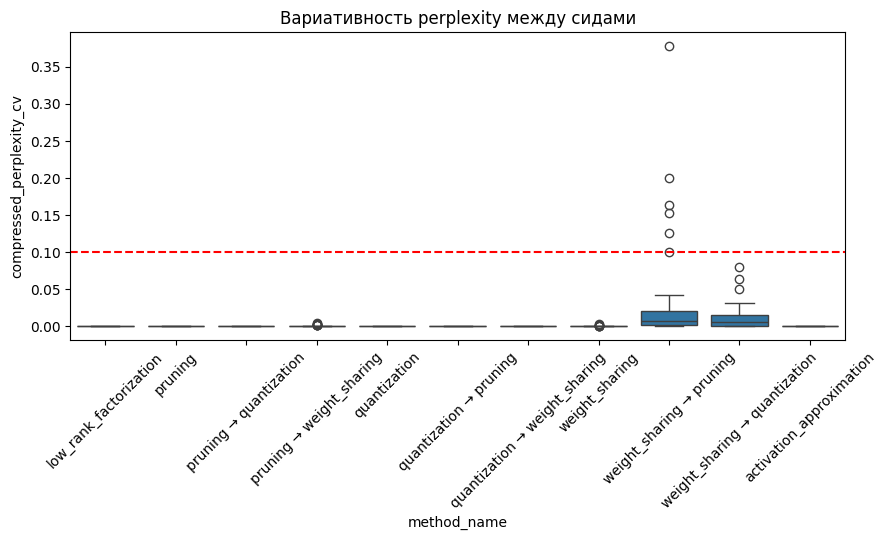

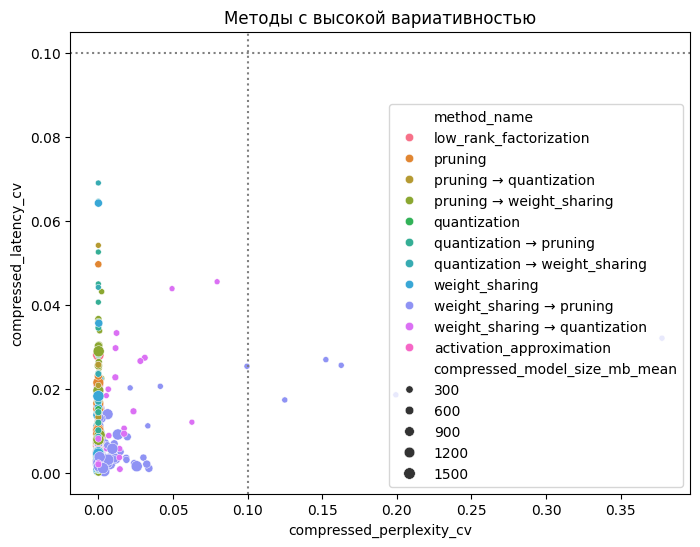

In [6]:
df_clean = df[~df['method'].apply(lambda x: 'random' in x)]
print(f"Size {df_clean.shape}")

# Группировка + расчет метрик вариативности
grouped = df_clean.groupby(["model", "method_name", "method"])

agg_funcs = {
    'compressed_perplexity': ['mean', 'std', lambda x: (x.max() - x.min())/x.mean()],
    'compressed_latency': ['mean', 'std', lambda x: (x.max() - x.min())/x.mean()],
    'compressed_model_size_mb': ['mean', 'std', lambda x: (x.max() - x.min())/x.mean()]
}

variability_report = grouped.agg(agg_funcs)
variability_report.columns = [
    f"{col[0]}_{'range' if 'lambda' in col[1] else col[1]}"  # Переименовываем lambda в range
    for col in variability_report.columns.values
]

# Добавляем коэффициент вариации (только для perplexity и latency)
for metric in ['perplexity', 'latency']:
    col_mean = f'compressed_{metric}_mean'
    col_std = f'compressed_{metric}_std'
    variability_report[f'compressed_{metric}_cv'] = variability_report[col_std] / variability_report[col_mean]

# Фильтрация нестабильных методов
unstable_methods = variability_report[
    (variability_report['compressed_perplexity_cv'] > 0.1) |
    (variability_report['compressed_latency_range'] > 0.15)  # Используем переименованную колонку
].sort_values(by='compressed_perplexity_cv', ascending=False)


THRESHOLDS = {
    'perplexity_cv': 0.1,    # 10% вариации
    'latency_range': 0.15,   # 15% разброса
    'model_size_std': 0.01   # 1MB абсолютного отклонения
}

# Распределение CV по методам
plt.figure(figsize=(10, 4))
sns.boxplot(
    data=variability_report.reset_index(),
    x='method_name',
    y='compressed_perplexity_cv'
)
plt.axhline(y=0.1, color='red', linestyle='--')
plt.title('Вариативность perplexity между сидами')
plt.xticks(rotation=45);

# Scatter plot: perplexity vs latency вариативность
plt.figure(figsize=(8, 6))
sns.scatterplot(
    data=variability_report.reset_index(),
    x='compressed_perplexity_cv',
    y='compressed_latency_cv',
    hue='method_name',
    size='compressed_model_size_mb_mean'
)
plt.axvline(x=0.1, color='grey', ls=':')
plt.axhline(y=0.1, color='grey', ls=':')
plt.title('Методы с высокой вариативностью');


for method in df['method_name'].unique():
    samples = [
        group['compressed_perplexity'].values 
        for _, group in df[df['method_name'] == method].groupby('seed')
    ]
    if len(samples) > 1:
        pvalue = stats.kruskal(*samples).pvalue  # Непараметрический аналог ANOVA
        print(f"{method}: p-value = {pvalue:.4f}")

## Анализ экспериментов

In [18]:
def get_df_avg(df):
    static_cols = ['model', 'method_name', 'method', 'filename', 
                'baseline_model_size_mb', 'baseline_total_params',
                'compressed_model_size_mb', 'compressed_total_params']

    dynamic_cols = [col for col in df.columns if col not in static_cols + ['seed', 'timestamp']]

    agg_rules = {
        **{col: 'first' for col in static_cols},
        **{col: 'mean' for col in dynamic_cols},
        'seed': 'count'
    }

    df_avg = df.groupby(["model", "method_name", "method"], as_index=False).agg(agg_rules)
    # df_avg.sort_values('comparison_cosine_similarity')
    df_avg['name_length'] = df_avg['method_name'].str.len()
    df_avg = df_avg.sort_values(by=['name_length', 'method'], ascending=True)
    df_avg = df_avg.drop('name_length', axis=1)

    return df_avg

In [19]:
df_avg = get_df_avg(df)
display(df_avg.head())
print(df_avg.shape)
df_avg.columns

,model,method_name,method,filename,baseline_model_size_mb,baseline_total_params,compressed_model_size_mb,compressed_total_params,baseline_perplexity,baseline_latency,baseline_nonzero_params,baseline_sparsity,baseline_weight_min,baseline_weight_max,baseline_weight_mean,baseline_weight_std,baseline_unique_weights,compressed_perplexity,compressed_latency,compressed_nonzero_params,compressed_sparsity,compressed_weight_min,compressed_weight_max,compressed_weight_mean,compressed_weight_std,compressed_unique_weights,comparison_cosine_similarity,comparison_mse,diff_size,diff_perplexity,diff_latency,diff_total_params,diff_sparsity,diff_unique_weights,seed
4,albert-base-v2,pruning,"amount=0.1, permanent=true, type=l1_unstructured",albert-base-v2_5_20250528_214304.json,42.815125,11182080,42.815125,11182080,19500.421313,0.054000,11182080.0,0.002673,-17.931103,34.356358,-0.001575,0.068919,11354.0,11695.224490,0.052323,10070632.0,0.101718,-17.931103,34.356358,-0.001573,0.068913,11354.0,0.948862,0.175840,0.0,7805.196823,0.001677,0.0,-0.099045,0.0,3
71,bert-base-uncased,pruning,"amount=0.1, permanent=true, type=l1_unstructured",bert-base-uncased_5_20250527_165645.json,417.771706,109380096,417.771706,109380096,10.207622,0.058845,109380096.0,0.000000,-6.817562,3.737355,-0.005806,0.043241,14996.0,10.182231,0.058328,98483568.0,0.099499,-6.817562,3.737355,-0.005800,0.043232,14996.0,0.999048,0.000472,0.0,0.025391,0.000516,0.0,-0.099499,0.0,3
144,bert-large-uncased,pruning,"amount=0.1, permanent=true, type=l1_unstructured",bert-large-uncased_5_20250528_020220.json,1278.596901,334870528,1278.596901,334870528,8.766385,0.181222,334870528.0,0.000000,-6.545752,6.953090,-0.001667,0.036945,15437.0,8.778818,0.181899,301441209.0,0.099737,-6.545752,6.953090,-0.001665,0.036937,15437.0,0.998812,0.000961,0.0,-0.012433,-0.000678,0.0,-0.099737,0.0,3
210,distilbert-base-uncased,pruning,"amount=0.1, permanent=true, type=l1_unstructured",distilbert-base-uncased_5_20250528_213108.json,255.533424,66902016,255.533424,66902016,17.251523,0.035576,66902016.0,0.000000,-9.962942,3.891517,-0.013208,0.049930,15784.0,17.795487,0.035760,60252216.0,0.099272,-9.962942,3.891517,-0.013185,0.049922,15784.0,0.999208,0.000294,0.0,-0.543964,-0.000184,0.0,-0.099272,0.0,3
277,roberta-base,pruning,"amount=0.1, permanent=true, type=l1_unstructured",roberta-base_5_20250528_123050.json,475.690800,124543488,475.690800,124543488,5.232958,0.066998,124541892.0,0.000013,-1.011719,1.303711,-0.005547,0.086342,8090.0,5.502510,0.066857,112129162.0,0.099556,-1.011719,1.303711,-0.005551,0.086325,8090.0,0.998993,0.000455,0.0,-0.269551,0.000142,0.0,-0.099543,0.0,3


(404, 35)


Index(['model', 'method_name', 'method', 'filename', 'baseline_model_size_mb',
       'baseline_total_params', 'compressed_model_size_mb',
       'compressed_total_params', 'baseline_perplexity', 'baseline_latency',
       'baseline_nonzero_params', 'baseline_sparsity', 'baseline_weight_min',
       'baseline_weight_max', 'baseline_weight_mean', 'baseline_weight_std',
       'baseline_unique_weights', 'compressed_perplexity',
       'compressed_latency', 'compressed_nonzero_params',
       'compressed_sparsity', 'compressed_weight_min', 'compressed_weight_max',
       'compressed_weight_mean', 'compressed_weight_std',
       'compressed_unique_weights', 'comparison_cosine_similarity',
       'comparison_mse', 'diff_size', 'diff_perplexity', 'diff_latency',
       'diff_total_params', 'diff_sparsity', 'diff_unique_weights', 'seed'],
      dtype='object')

In [20]:
df.groupby(['model'], as_index=False).agg({'baseline_total_params':'first'}).sort_values('baseline_total_params')

,model,baseline_total_params
0,albert-base-v2,11182080
3,distilbert-base-uncased,66902016
1,bert-base-uncased,109380096
4,roberta-base,124543488
2,bert-large-uncased,334870528
5,roberta-large,355088384


### Изучение одной модели

Size (958, 36)


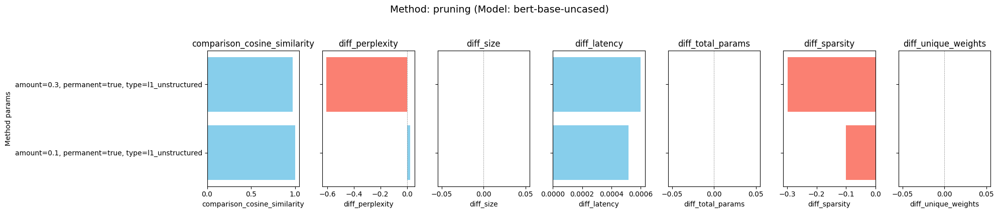

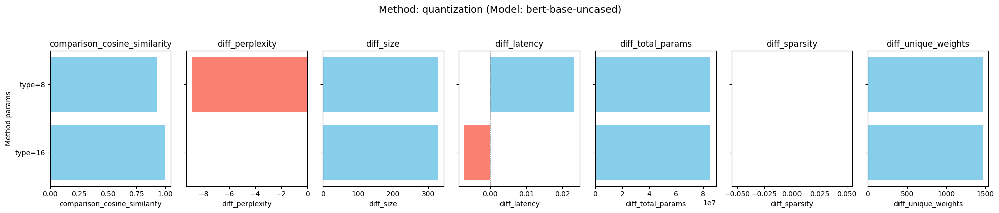

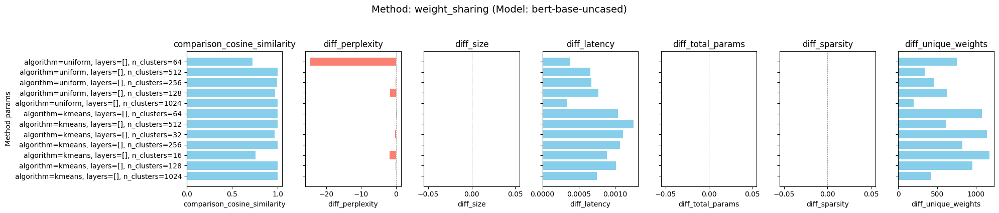

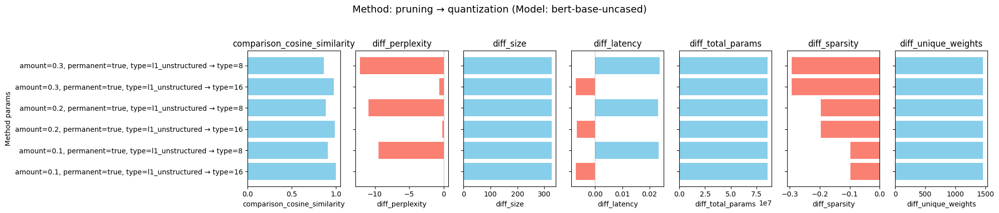

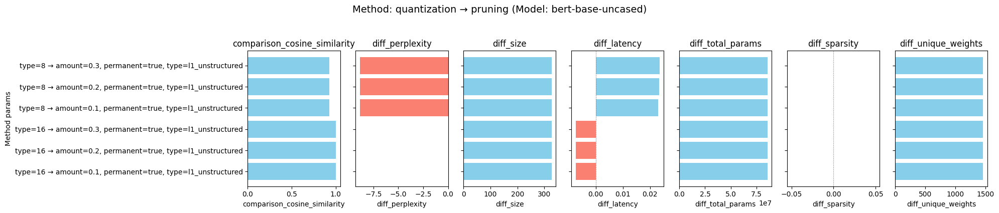

...

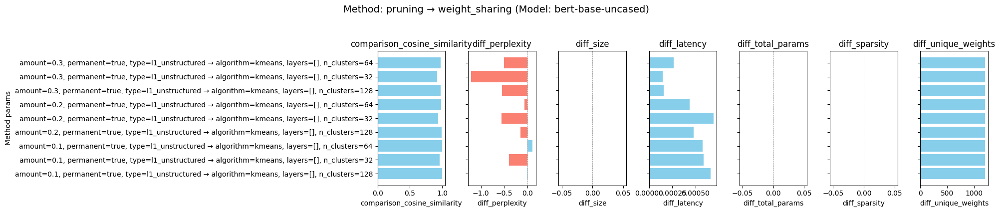

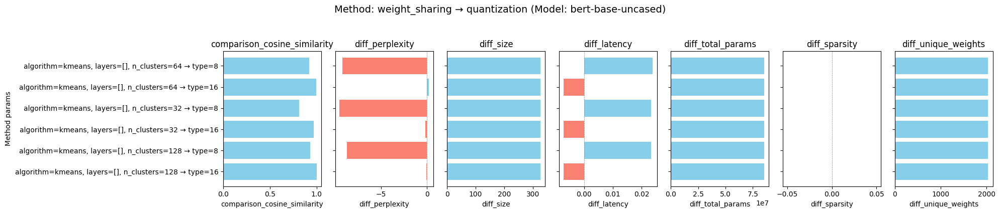

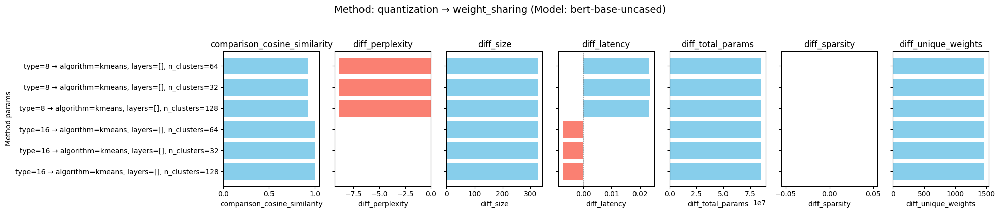

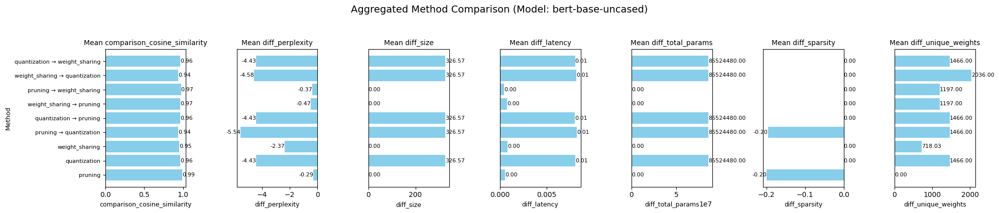

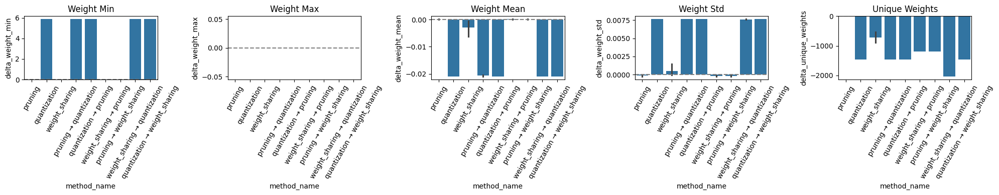

In [ ]:
def overview_experiments(df, model, targets, seed=None):
    if seed is None:
        df_plot = get_df_avg(df)
    else:
        df_plot = df.copy()
    

    if model is None:
        df_model = df_plot
    else:
        df_model = df_plot[df_plot['model'] == model]
    
    for method_name in df_model['method_name'].unique():
        df_temp = df_model[df_model['method_name'] == method_name] if seed is None else \
                 df_model[(df_model['method_name'] == method_name) & (df_model['seed'] == seed)]
        
        fig, axes = plt.subplots(nrows=1, ncols=len(targets), figsize=(20, 4))
        fig.suptitle(f"Method: {method_name} (Model: {model})", fontsize=14, y=1.05)
        
        for i, target in enumerate(targets):
            positive_values = np.where(df_temp[target] >= 0, df_temp[target], 0)
            negative_values = np.where(df_temp[target] < 0, df_temp[target], 0)
            
            axes[i].barh(df_temp['method'], positive_values, color='skyblue')
            axes[i].barh(df_temp['method'], negative_values, color='salmon')
            
            axes[i].set_title(target)
            axes[i].set_xlabel(target)
            axes[i].axvline(0, color='gray', linestyle='--', linewidth=0.5)
            
            if i > 0:
                axes[i].set_ylabel('')
                axes[i].set_yticklabels([])
            else:
                axes[i].set_ylabel('Method params')
        
        plt.tight_layout()
        plt.show()
    
    fig, axes = plt.subplots(nrows=1, ncols=len(targets), figsize=(20, 4), sharey=True)  # Добавляем sharey=True
    fig.suptitle(f"Aggregated Method Comparison (Model: {model})", fontsize=14, y=1.05)

    # Группируем без сортировки, сохраняем исходный порядок методов
    agg_df = df_model.groupby('method_name')[targets].mean().reset_index()

    # Сохраняем порядок методов как в исходных данных
    method_order = df_model['method_name'].unique()
    agg_df['method_name'] = pd.Categorical(agg_df['method_name'], categories=method_order, ordered=True)
    agg_df = agg_df.sort_values('method_name')

    for i, target in enumerate(targets):
        # Убираем сортировку по значению метрики
        axes[i].barh(agg_df['method_name'], agg_df[target], color='skyblue')
        
        # Добавляем аннотации значений
        for j, value in enumerate(agg_df[target]):
            axes[i].text(value, j, f"{value:.2f}", va='center', ha='left' if value >= 0 else 'right',
                        fontsize=8)  # Уменьшаем размер шрифта
        
        axes[i].set_title(f"Mean {target}", fontsize=10)
        axes[i].set_xlabel(target, fontsize=9)
        axes[i].axvline(0, color='gray', linestyle='--', linewidth=0.5)
        
        # Настройки осей
        if i > 0:
            axes[i].set_ylabel('')
            axes[i].tick_params(axis='y', which='both', left=False, labelleft=False)
        else:
            axes[i].set_ylabel('Method', fontsize=9)
            axes[i].tick_params(axis='y', labelsize=8)  # Уменьшаем размер шрифта меток

    # Дополнительные настройки для предотвращения наложения
    plt.subplots_adjust(wspace=0.3)  # Увеличиваем расстояние между подграфиками
    plt.tight_layout()
    plt.show()
    
    df_model = df_model.assign(
        delta_weight_min=df_model['compressed_weight_min'] - df_model['baseline_weight_min'],
        delta_weight_max=df_model['compressed_weight_max'] - df_model['baseline_weight_max'],
        delta_weight_mean=df_model['compressed_weight_mean'] - df_model['baseline_weight_mean'],
        delta_weight_std=df_model['compressed_weight_std'] - df_model['baseline_weight_std'],
        delta_unique_weights=df_model['compressed_unique_weights'] - df_model['baseline_unique_weights']
    )
    
    weight_metrics = [
        'delta_weight_min', 'delta_weight_max', 
        'delta_weight_mean', 'delta_weight_std',
        'delta_unique_weights'
    ]
    
    fig, axes = plt.subplots(1, 5, figsize=(20, 4))
    axes = axes.flatten()
    
    for i, metric in enumerate(weight_metrics[:5]):
        sns.barplot(data=df_model, x='method_name', y=metric, ax=axes[i])
        axes[i].set_title(metric.replace('delta_', '').replace('_', ' ').title())
        axes[i].tick_params(axis='x', rotation=60)
        axes[i].axhline(0, color='gray', linestyle='--')
    
    plt.tight_layout()
    plt.show()

model = "bert-base-uncased" # bert-base-uncased   roberta-base   roberta-large   bert-large-uncased   distilbert-base-uncased   albert-base-v2


targets = [
    "comparison_cosine_similarity", 
    # "comparison_mse", 
    "diff_perplexity",
    "diff_size", 
    "diff_latency",
    "diff_total_params",
    "diff_sparsity",
    "diff_unique_weights"
]

def clean_methods(df, cleans, methods_names):
    df_clean = df.copy()
    for clean in cleans:
        df_clean = df_clean[~df_clean['method'].apply(lambda x: clean in x)]

    for name in methods_names:
        df_clean = df_clean[df_clean['method_name'] != name]
    print(f"Size {df_clean.shape}")
    return df_clean

cleans = [
    'algorithm=uniform, layers=[], n_clusters=16',
    'algorithm=uniform, layers=[], n_clusters=32',
    'uniform',
    'random',
    'amount=0.7',
    'amount=0.5'
]
clean_methods_names = [
    'low_rank_factorization', 
    'activation_approximation'
]

df_clean = clean_methods(df, cleans, clean_methods_names)
overview_experiments(df_clean, model, targets)

### Сравнение по всем моделям

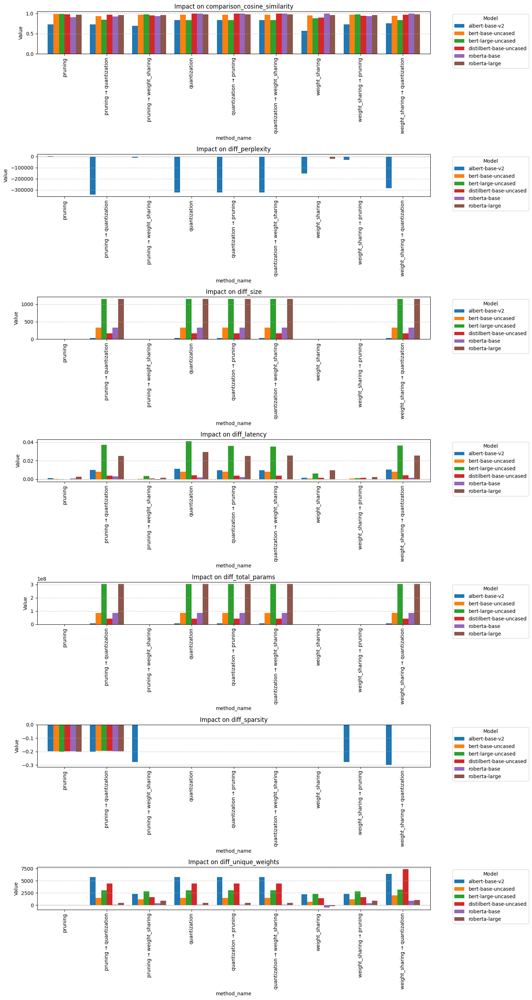

In [10]:
def plot_combined_method_impact(df, targets):
    agg_df = df.groupby(['model', 'method_name'])[targets].mean().reset_index()
    
    n_metrics = len(targets)
    fig, axes = plt.subplots(nrows=n_metrics, ncols=1, figsize=(15, 4*n_metrics))
    
    for i, target in enumerate(targets):
        pivot_df = agg_df.pivot(index='method_name', columns='model', values=target)
        
        pivot_df.plot(kind='bar', ax=axes[i], width=0.8)
        
        axes[i].set_title(f'Impact on {target}', fontsize=12)
        axes[i].set_ylabel('Value')
        axes[i].axhline(0, color='gray', linestyle='--', linewidth=0.5)
        axes[i].legend(title='Model', bbox_to_anchor=(1.05, 1), loc='upper left')
        axes[i].grid(axis='y', linestyle='--', alpha=0.7)
    
    plt.tight_layout()
    plt.show()


plot_combined_method_impact(df_clean, targets)
# plot_combined_method_impact(get_df_avg(df), targets)

### Общее сравнение методов

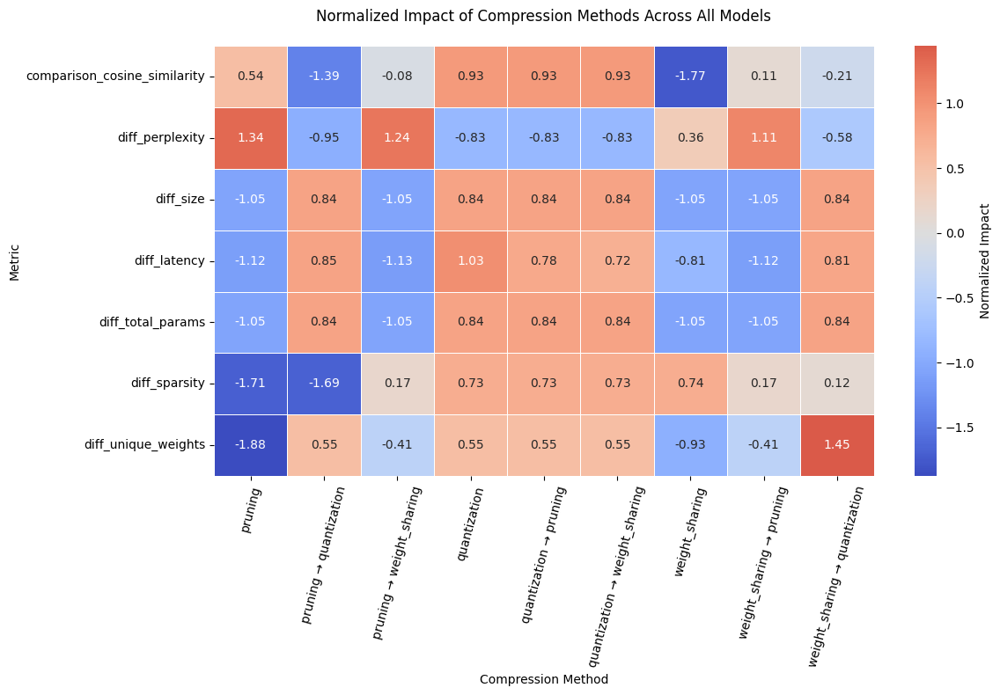

In [11]:
def plot_combined_heatmap(df, targets):
    # Агрегируем данные по методам (усредняя по моделям)
    method_impact = df.groupby('method_name')[targets].mean()
    
    # Нормализуем данные для лучшей визуализации
    norm_impact = (method_impact - method_impact.mean()) / method_impact.std()
    
    plt.figure(figsize=(12, 8))
    sns.heatmap(norm_impact.T, 
                cmap='coolwarm', 
                center=0,
                annot=True, 
                fmt=".2f",
                linewidths=.5,
                cbar_kws={'label': 'Normalized Impact'})
    
    plt.title('Normalized Impact of Compression Methods Across All Models', pad=20)
    plt.xlabel('Compression Method')
    plt.ylabel('Metric')
    plt.xticks(rotation=75)
    plt.tight_layout()
    plt.show()

plot_combined_heatmap(df_clean, targets)

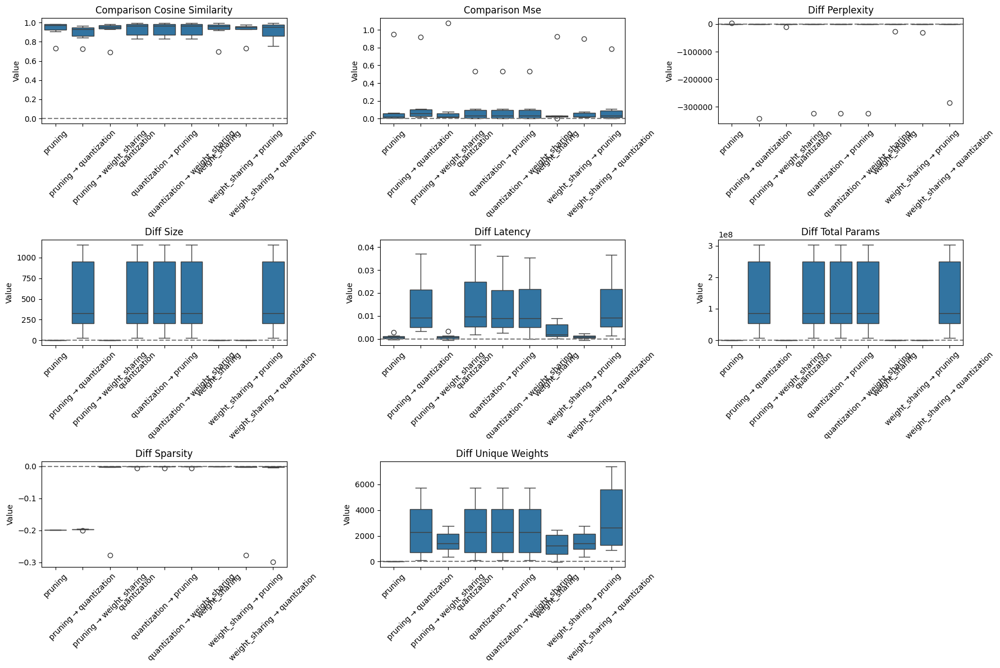

In [20]:
def plot_small_multiples(df, targets):
    # Агрегируем данные
    agg_df = df.groupby(['model', 'method_name'])[targets].mean().reset_index()
    
    # Создаем grid графиков
    n_metrics = len(targets)
    n_cols = 3
    n_rows = (n_metrics + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(18, 4*n_rows))
    axes = axes.flatten()
    
    for i, target in enumerate(targets):
        sns.boxplot(data=agg_df, x='method_name', y=target, ax=axes[i])
        axes[i].set_title(target.replace('_', ' ').title())
        axes[i].set_xlabel('')
        axes[i].set_ylabel('Value')
        axes[i].tick_params(axis='x', rotation=45)
        axes[i].axhline(0, color='gray', linestyle='--')
    
    # Скрываем неиспользованные оси
    for j in range(i+1, len(axes)):
        axes[j].set_visible(False)
    
    plt.tight_layout()
    plt.show()

plot_small_multiples(df_clean, targets)

### Поиск лучших методов

In [22]:
df_avg['method'] = df_avg['method_name'] + ' ' + df_avg['method']

In [35]:
for i in df_avg['method_name'].unique():
    print(f"'{i}'", end=',\n')

'pruning',
'quantization',
'weight_sharing',
'pruning → quantization',
'low_rank_factorization',
'quantization → pruning',
'weight_sharing → pruning',
'pruning → weight_sharing',
'activation_approximation',
'weight_sharing → quantization',
'quantization → weight_sharing',


In [80]:
# df_avg[(df_avg['method_name'] == "weight_sharing") & (df_avg['model'] == "bert-base-uncased")]

In [55]:
def compare_compression_methods(df, model_name, method_names, metrics, top_percents, treshold_cos_sim=0.85, plot=True):
    # Фильтрация данных
    filtered_df = df[(df['model'] == model_name) & 
                    (df['method'].isin(method_names))]
    
    if filtered_df.empty:
        print(f"Нет данных для модели '{model_name}' и методов {method_names}")
        return
    
    # Группировка и расчет среднего
    grouped = filtered_df.groupby('method')[metrics].mean().reset_index()
    
    # Словарь для хранения топ методов по каждой метрике
    top_methods_dict = {}
    
    for metric, top_percent  in zip(metrics, top_percents):
        n = max(1, int(len(grouped) * top_percent))
        sorted_df = grouped.sort_values(by=metric, ascending=False).head(n)
        if metric == 'comparison_cosine_similarity':
            sorted_df = sorted_df[sorted_df[metric] >= treshold_cos_sim]
        top_methods = set(sorted_df['method'].unique())
        top_methods_dict[metric] = top_methods
        
        # Визуализация (сохраняем оригинальный код)
        if plot:
            plt.figure(figsize=(10, 6))
            plot = sns.barplot(data=sorted_df, y='method', x=metric, 
                            palette='viridis', hue='method', dodge=False)
            plt.ylabel('Метод сжатия')
            plt.xlabel(metric)
            plt.title(f'Метрика: {metric}')
            plt.legend().remove()
            plt.tight_layout()
            plt.show()
    
    # Находим пересечение всех топ методов
    common_top_methods = set.intersection(*top_methods_dict.values())
    
    if common_top_methods:
        print(f"\nМетоды, входящие в топ по всем метрикам для {model_name}:")
        for method in common_top_methods:
            print("-", method)
    else:
        print(f"\nНет пересечения по топам для {model_name}")
    
    return common_top_methods


In [36]:
df_avg.head(2)

,model,method_name,method,filename,baseline_model_size_mb,baseline_total_params,compressed_model_size_mb,compressed_total_params,baseline_perplexity,baseline_latency,baseline_nonzero_params,baseline_sparsity,baseline_weight_min,baseline_weight_max,baseline_weight_mean,baseline_weight_std,baseline_unique_weights,compressed_perplexity,compressed_latency,compressed_nonzero_params,compressed_sparsity,compressed_weight_min,compressed_weight_max,compressed_weight_mean,compressed_weight_std,compressed_unique_weights,comparison_cosine_similarity,comparison_mse,diff_size,diff_perplexity,diff_latency,diff_total_params,diff_sparsity,diff_unique_weights,seed
4,albert-base-v2,pruning,"pruning amount=0.1, permanent=true, type=l1_un...",albert-base-v2_5_20250528_214304.json,42.815125,11182080,42.815125,11182080,19500.421313,0.054000,11182080.0,0.002673,-17.931103,34.356358,-0.001575,0.068919,11354.0,11695.224490,0.052323,10070632.0,0.101718,-17.931103,34.356358,-0.001573,0.068913,11354.0,0.948862,0.175840,0.0,7805.196823,0.001677,0.0,-0.099045,0.0,3
71,bert-base-uncased,pruning,"pruning amount=0.1, permanent=true, type=l1_un...",bert-base-uncased_5_20250527_165645.json,417.771706,109380096,417.771706,109380096,10.207622,0.058845,109380096.0,0.000000,-6.817562,3.737355,-0.005806,0.043241,14996.0,10.182231,0.058328,98483568.0,0.099499,-6.817562,3.737355,-0.005800,0.043232,14996.0,0.999048,0.000472,0.0,0.025391,0.000516,0.0,-0.099499,0.0,3


#### Сравнение первичных методов

In [74]:
# model_name = "bert-base-uncased" # albert-base-v2    bert-base-uncased    bert-large-uncased    distilbert-base-uncased    roberta-base    roberta-large

# type_method = [
#     'pruning',
#     'quantization',
#     'weight_sharing',
#     'low_rank_factorization',
#     'activation_approximation',
# ]
# method_names = df_avg[df_avg['method_name'].isin(type_method)]['method'].unique()


# targets = [
#     "comparison_cosine_similarity", 
#     # "comparison_mse", 
#     "diff_perplexity",
#     # "diff_size", 
#     "diff_latency",
#     # "diff_total_params",
#     # "diff_sparsity",
#     "diff_unique_weights"
# ]

# top_percents = [
#     1,
#     0.25,
#     0.25,
#     0.25, 
# ]
# # top_percents = [1] * len(targets)

# res = compare_compression_methods(df_avg, model_name, method_names, targets, top_percents, 0.8)

In [71]:
# Выделим лучшие методы по каждой модели
type_method = [
    'pruning',
    'quantization',
    'weight_sharing',
    'low_rank_factorization',
    'activation_approximation',
]
method_names = df_avg[df_avg['method_name'].isin(type_method)]['method'].unique()
targets = [
    "comparison_cosine_similarity", 
    "diff_perplexity",
    "diff_latency",
    "diff_unique_weights"
]
top_percents = [
    1,
    0.35,
    0.35,
    0.35, 
]

count_top = {}
for model_name in df_avg['model'].unique():
    res = compare_compression_methods(df_avg, model_name, method_names, targets, top_percents, 0.85, plot=False)
    for m in res:
        count_top[m] = 1 + count_top.get(m, 0)

print('\nОбщий топ')
top_list = sorted(count_top.items(), key=lambda x: x[1], reverse=True)
for m in top_list:
    print(m)
    
    




Нет пересечения по топам для albert-base-v2

Методы, входящие в топ по всем метрикам для bert-base-uncased:
- weight_sharing algorithm=kmeans, layers=[], n_clusters=64
- weight_sharing algorithm=kmeans, layers=[], n_clusters=256

Методы, входящие в топ по всем метрикам для bert-large-uncased:
- weight_sharing algorithm=kmeans, layers=[], n_clusters=64
- weight_sharing algorithm=kmeans, layers=[], n_clusters=128
- weight_sharing algorithm=kmeans, layers=[], n_clusters=256

Нет пересечения по топам для distilbert-base-uncased

Методы, входящие в топ по всем метрикам для roberta-base:
- weight_sharing algorithm=kmeans, layers=[], n_clusters=32

Методы, входящие в топ по всем метрикам для roberta-large:
- weight_sharing algorithm=kmeans, layers=[], n_clusters=32
- weight_sharing algorithm=kmeans, layers=[], n_clusters=64

Общий топ
('weight_sharing algorithm=kmeans, layers=[], n_clusters=64', 3)
('weight_sharing algorithm=kmeans, layers=[], n_clusters=256', 2)
('weight_sharing algorithm=k

#### Сравнение парных методов

In [101]:
type_method = [
    'pruning → quantization',
    'quantization → pruning',
    'weight_sharing → pruning',
    'pruning → weight_sharing',
    'weight_sharing → quantization',
    'quantization → weight_sharing'
]
method_names = df_avg[df_avg['method_name'].isin(type_method)]['method'].unique()
targets = [
    "comparison_cosine_similarity", 
    "diff_perplexity",
    "diff_latency",
    "diff_unique_weights"
]
top_percents = [
    1,
    0.4,
    0.5,
    0.4, 
]

count_top = {}
for model_name in df_avg['model'].unique():
    res = compare_compression_methods(df_avg, model_name, method_names, targets, top_percents, 0.85, plot=False)
    for m in res:
        count_top[m] = 1 + count_top.get(m, 0)

print('\nОбщий топ')
top_list = sorted(count_top.items(), key=lambda x: x[1], reverse=True)
for m in top_list:
    print(m)
    
    




Методы, входящие в топ по всем метрикам для albert-base-v2:
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=128 → type=16
- pruning → quantization amount=0.1, permanent=true, type=l1_unstructured → type=16
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=64 → type=16

Нет пересечения по топам для bert-base-uncased

Нет пересечения по топам для bert-large-uncased

Нет пересечения по топам для distilbert-base-uncased

Методы, входящие в топ по всем метрикам для roberta-base:
- pruning → weight_sharing amount=0.1, permanent=true, type=l1_unstructured → algorithm=kmeans, layers=[], n_clusters=32
- pruning → weight_sharing amount=0.1, permanent=true, type=l1_unstructured → algorithm=kmeans, layers=[], n_clusters=128

Методы, входящие в топ по всем метрикам для roberta-large:
- pruning → weight_sharing amount=0.1, permanent=true, type=l1_unstructured → algorithm=kmeans, layers=[], n_clusters=32
- weight_sharing → quantization algorithm=kmeans, 

#### Сравнение всех методов

In [109]:
method_names = df_avg['method'].unique()
targets = [
    "comparison_cosine_similarity", 
    "diff_perplexity",
    "diff_latency",
    "diff_unique_weights"
]
top_percents = [
    1,
    0.3,
    0.5,
    0.5, 
]

count_top = {}
for model_name in df_avg['model'].unique():
    res = compare_compression_methods(df_avg, model_name, method_names, targets, top_percents, 0.85, plot=False)
    for m in res:
        count_top[m] = 1 + count_top.get(m, 0)

print('\nОбщий топ')
top_list = sorted(count_top.items(), key=lambda x: x[1], reverse=True)
for m in top_list:
    if m[1] != 1:
        print(m)


Методы, входящие в топ по всем метрикам для albert-base-v2:
- pruning → quantization amount=0.1, permanent=true, type=l1_unstructured → type=16
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=128 → type=16

Методы, входящие в топ по всем метрикам для bert-base-uncased:
- pruning → weight_sharing amount=0.1, permanent=true, type=l1_unstructured → algorithm=kmeans, layers=[], n_clusters=64
- pruning → weight_sharing amount=0.1, permanent=true, type=l1_unstructured → algorithm=kmeans, layers=[], n_clusters=128

Нет пересечения по топам для bert-large-uncased

Методы, входящие в топ по всем метрикам для distilbert-base-uncased:
- pruning → weight_sharing amount=0.1, permanent=true, type=l1_unstructured → algorithm=kmeans, layers=[], n_clusters=128

Методы, входящие в топ по всем метрикам для roberta-base:
- weight_sharing → pruning algorithm=kmeans, layers=[], n_clusters=128 → amount=0.1, permanent=true, type=l1_unstructured
- pruning → weight_sharing amount=0.1, p

### Сравнение симметричных методов

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()


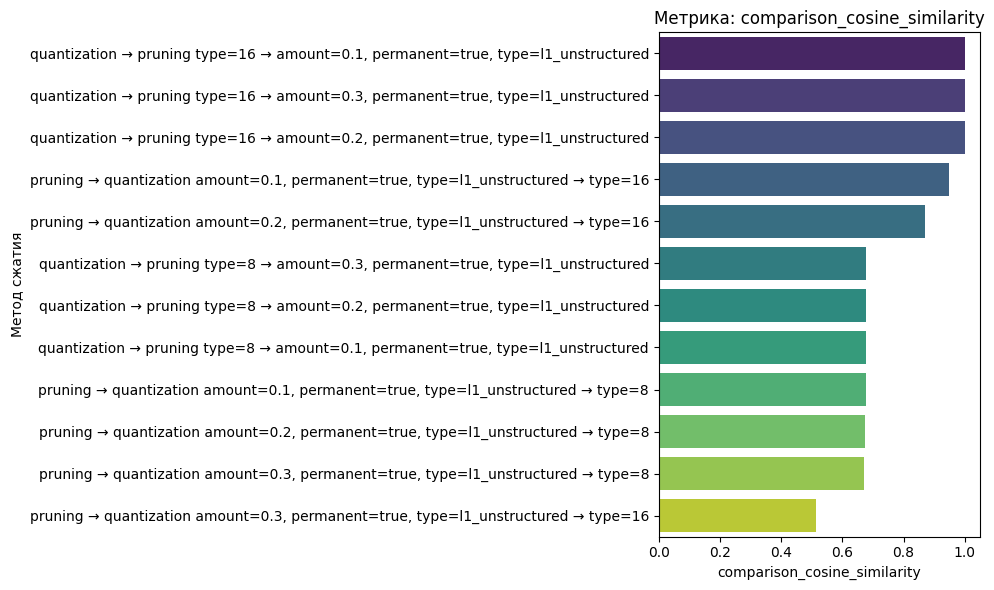

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()


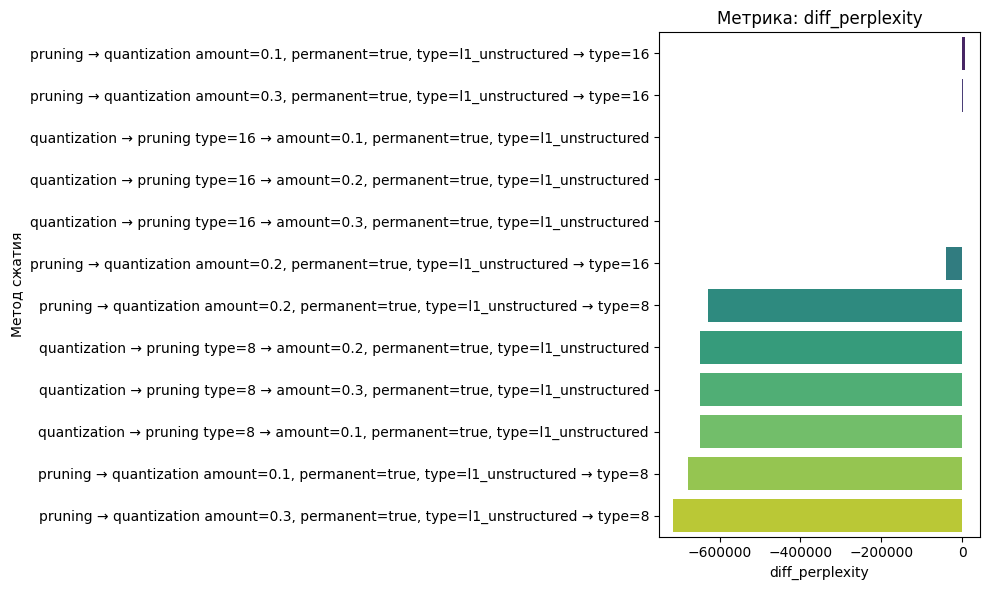

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()



Методы, входящие в топ по всем метрикам для albert-base-v2:
- quantization → pruning type=8 → amount=0.2, permanent=true, type=l1_unstructured
- quantization → pruning type=16 → amount=0.1, permanent=true, type=l1_unstructured
- pruning → quantization amount=0.1, permanent=true, type=l1_unstructured → type=8
- quantization → pruning type=8 → amount=0.3, permanent=true, type=l1_unstructured
- pruning → quantization amount=0.1, permanent=true, type=l1_unstructured → type=16
- pruning → quantization amount=0.3, permanent=true, type=l1_unstructured → type=16
- pruning → quantization amount=0.2, permanent=true, type=l1_unstructured → type=16
- quantization → pruning type=16 → amount=0.2, permanent=true, type=l1_unstructured
- quantization → pruning type=8 → amount=0.1, permanent=true, type=l1_unstructured
- pruning → quantization amount=0.3, permanent=true, type=l1_unstructured → type=8
- quantization → pruning type=16 → amount=0.3, permanent=true, type=l1_unstructured
- pruning → quantiza

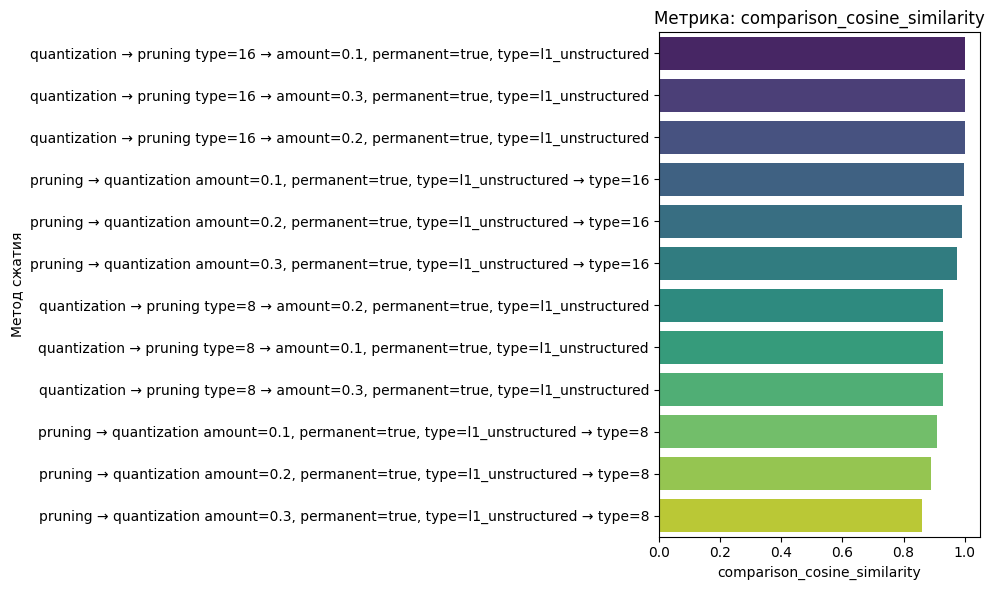

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()


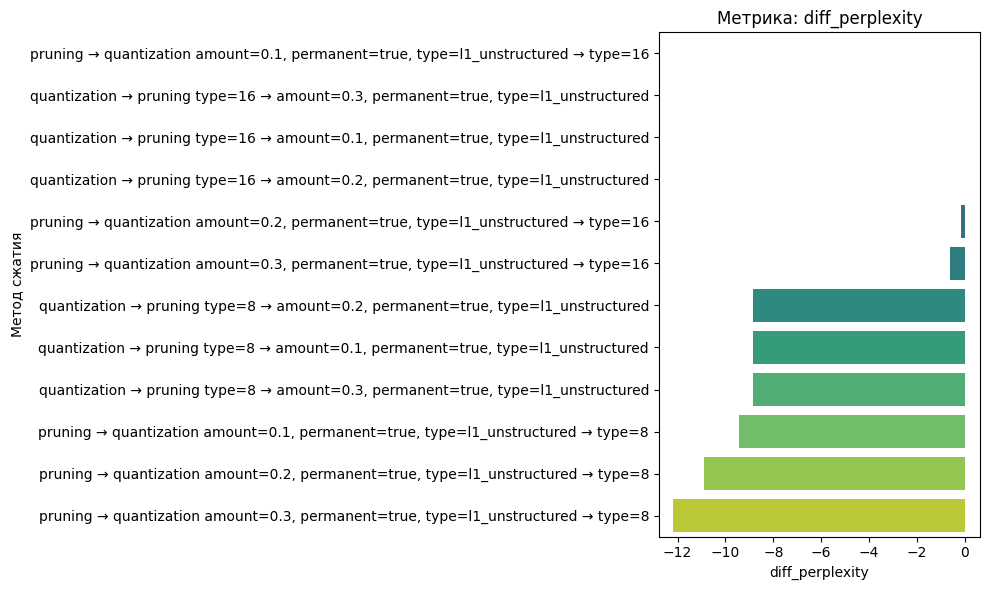

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()



Методы, входящие в топ по всем метрикам для bert-base-uncased:
- quantization → pruning type=8 → amount=0.2, permanent=true, type=l1_unstructured
- quantization → pruning type=16 → amount=0.1, permanent=true, type=l1_unstructured
- pruning → quantization amount=0.1, permanent=true, type=l1_unstructured → type=8
- quantization → pruning type=8 → amount=0.3, permanent=true, type=l1_unstructured
- pruning → quantization amount=0.1, permanent=true, type=l1_unstructured → type=16
- pruning → quantization amount=0.3, permanent=true, type=l1_unstructured → type=16
- pruning → quantization amount=0.2, permanent=true, type=l1_unstructured → type=16
- quantization → pruning type=16 → amount=0.2, permanent=true, type=l1_unstructured
- quantization → pruning type=8 → amount=0.1, permanent=true, type=l1_unstructured
- pruning → quantization amount=0.3, permanent=true, type=l1_unstructured → type=8
- quantization → pruning type=16 → amount=0.3, permanent=true, type=l1_unstructured
- pruning → quant

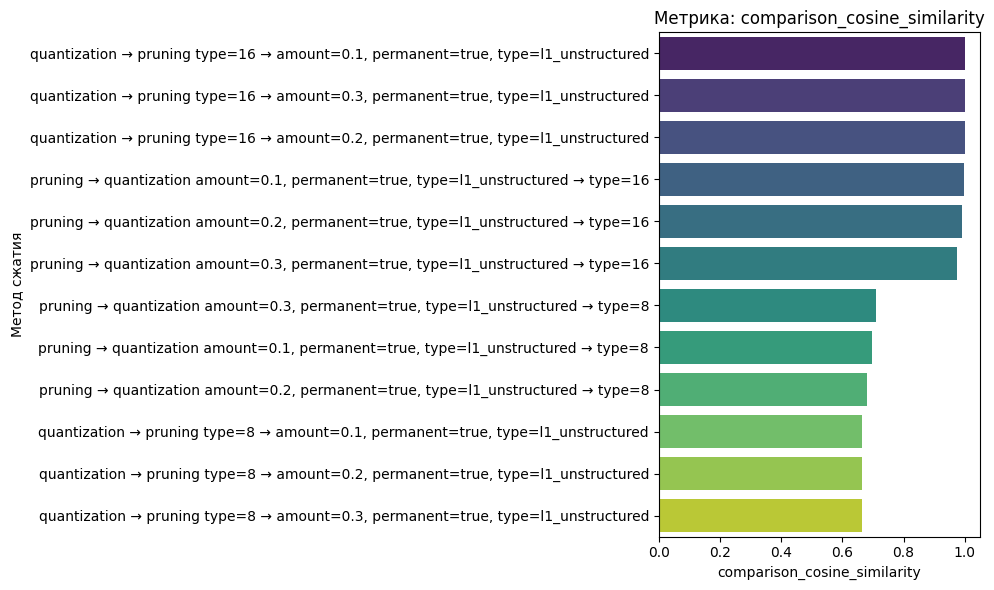

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()


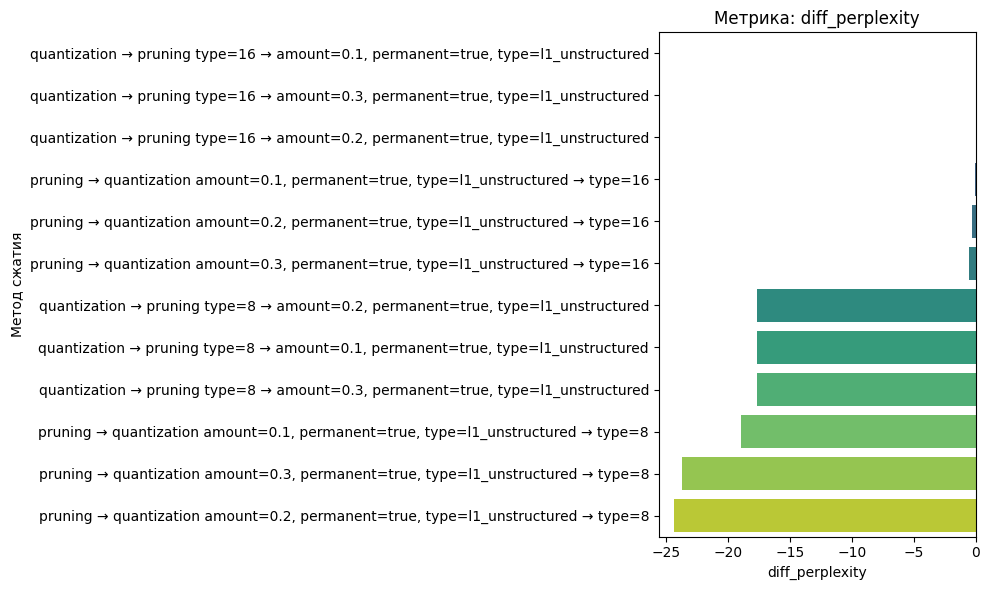

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()



Методы, входящие в топ по всем метрикам для bert-large-uncased:
- quantization → pruning type=8 → amount=0.2, permanent=true, type=l1_unstructured
- quantization → pruning type=16 → amount=0.1, permanent=true, type=l1_unstructured
- pruning → quantization amount=0.1, permanent=true, type=l1_unstructured → type=8
- quantization → pruning type=8 → amount=0.3, permanent=true, type=l1_unstructured
- pruning → quantization amount=0.1, permanent=true, type=l1_unstructured → type=16
- pruning → quantization amount=0.3, permanent=true, type=l1_unstructured → type=16
- pruning → quantization amount=0.2, permanent=true, type=l1_unstructured → type=16
- quantization → pruning type=16 → amount=0.2, permanent=true, type=l1_unstructured
- quantization → pruning type=8 → amount=0.1, permanent=true, type=l1_unstructured
- pruning → quantization amount=0.3, permanent=true, type=l1_unstructured → type=8
- quantization → pruning type=16 → amount=0.3, permanent=true, type=l1_unstructured
- pruning → quan

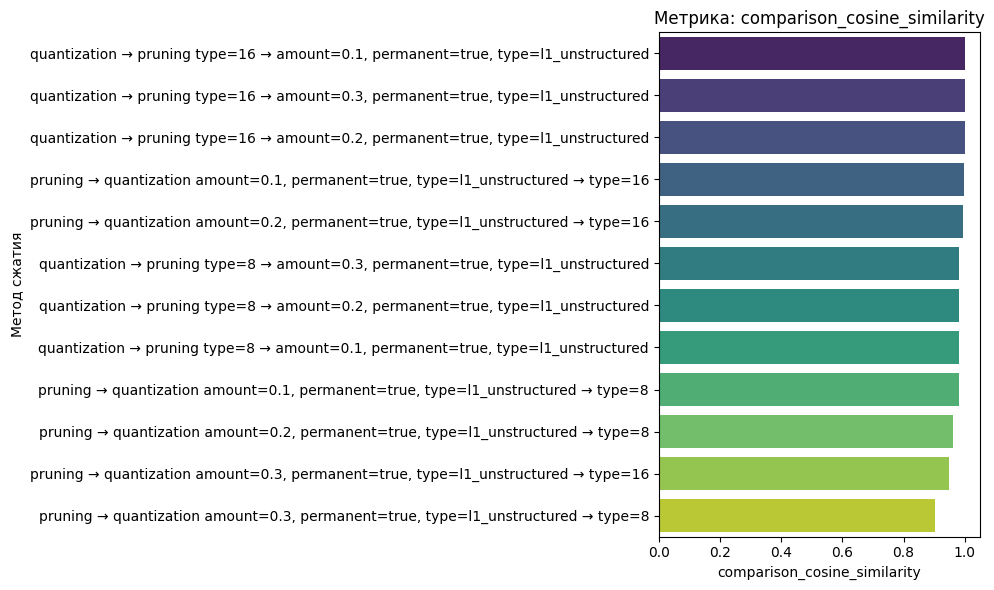

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()


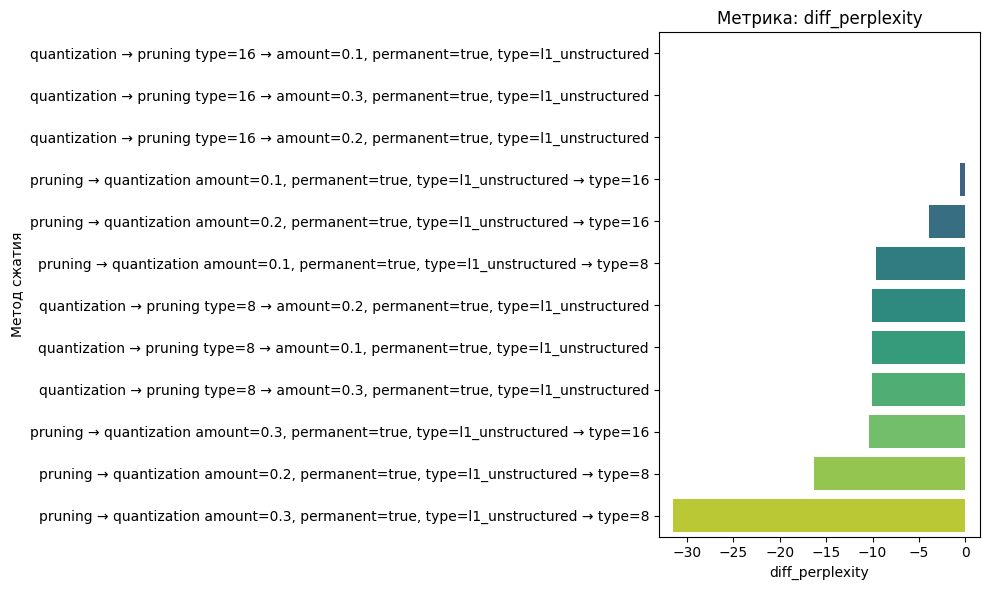

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()



Методы, входящие в топ по всем метрикам для distilbert-base-uncased:
- quantization → pruning type=8 → amount=0.2, permanent=true, type=l1_unstructured
- quantization → pruning type=16 → amount=0.1, permanent=true, type=l1_unstructured
- pruning → quantization amount=0.1, permanent=true, type=l1_unstructured → type=8
- quantization → pruning type=8 → amount=0.3, permanent=true, type=l1_unstructured
- pruning → quantization amount=0.1, permanent=true, type=l1_unstructured → type=16
- pruning → quantization amount=0.3, permanent=true, type=l1_unstructured → type=16
- pruning → quantization amount=0.2, permanent=true, type=l1_unstructured → type=16
- quantization → pruning type=16 → amount=0.2, permanent=true, type=l1_unstructured
- quantization → pruning type=8 → amount=0.1, permanent=true, type=l1_unstructured
- pruning → quantization amount=0.3, permanent=true, type=l1_unstructured → type=8
- quantization → pruning type=16 → amount=0.3, permanent=true, type=l1_unstructured
- pruning →

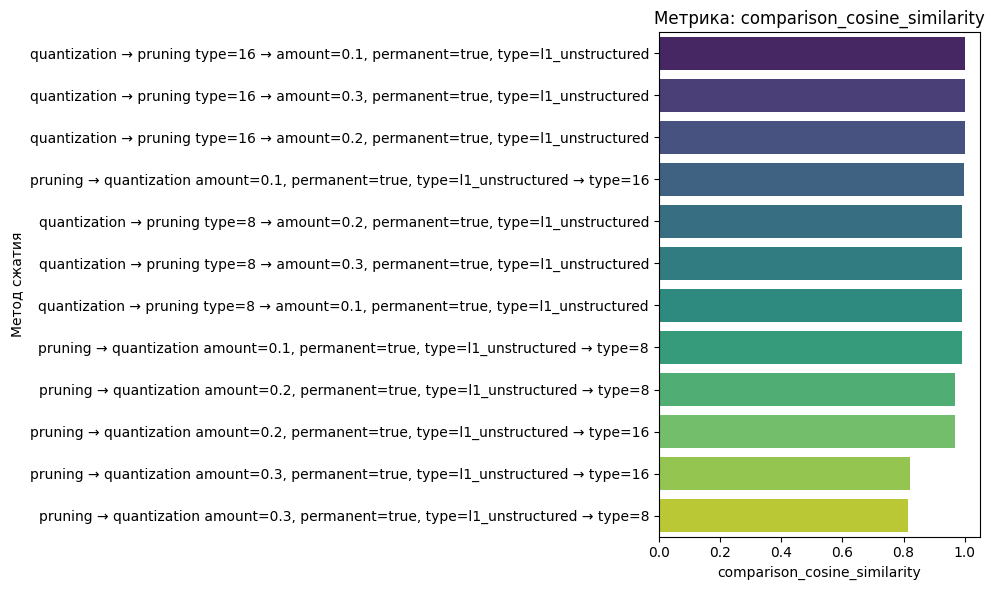

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()


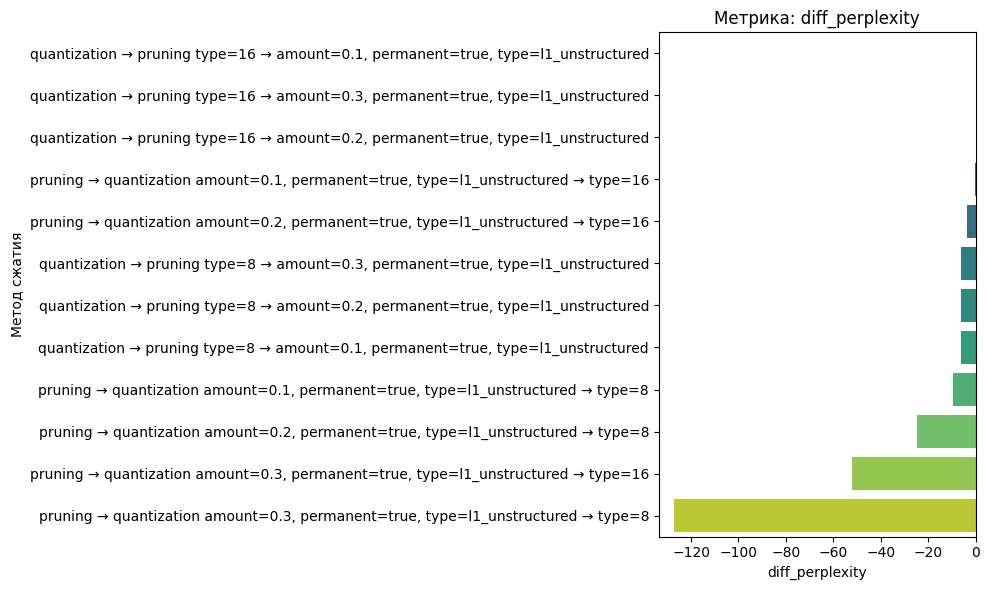

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()



Методы, входящие в топ по всем метрикам для roberta-base:
- quantization → pruning type=8 → amount=0.2, permanent=true, type=l1_unstructured
- quantization → pruning type=16 → amount=0.1, permanent=true, type=l1_unstructured
- pruning → quantization amount=0.1, permanent=true, type=l1_unstructured → type=8
- quantization → pruning type=8 → amount=0.3, permanent=true, type=l1_unstructured
- pruning → quantization amount=0.1, permanent=true, type=l1_unstructured → type=16
- pruning → quantization amount=0.3, permanent=true, type=l1_unstructured → type=16
- pruning → quantization amount=0.2, permanent=true, type=l1_unstructured → type=16
- quantization → pruning type=16 → amount=0.2, permanent=true, type=l1_unstructured
- quantization → pruning type=8 → amount=0.1, permanent=true, type=l1_unstructured
- pruning → quantization amount=0.3, permanent=true, type=l1_unstructured → type=8
- quantization → pruning type=16 → amount=0.3, permanent=true, type=l1_unstructured
- pruning → quantizati

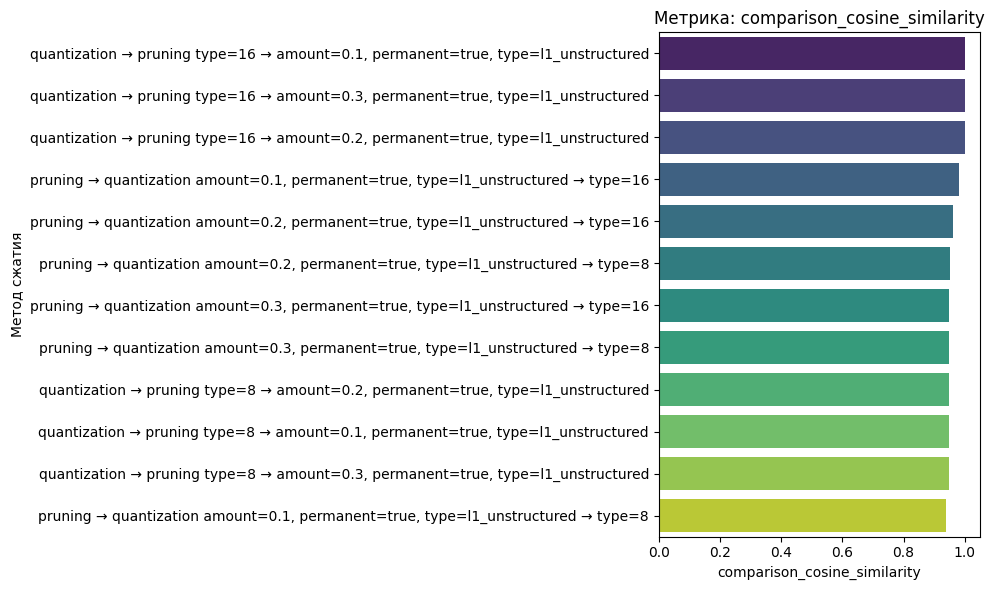

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()


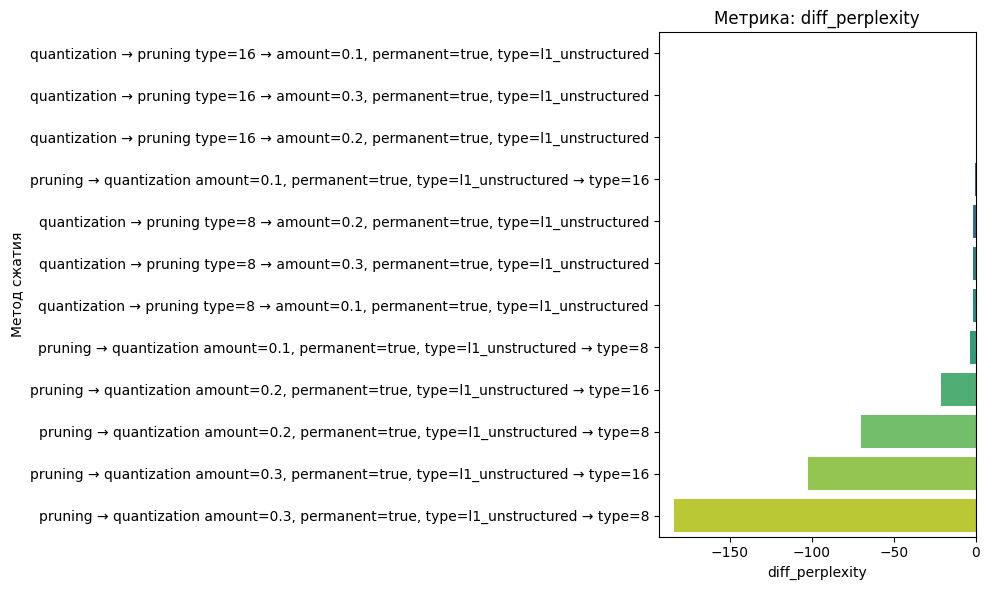


Методы, входящие в топ по всем метрикам для roberta-large:
- quantization → pruning type=16 → amount=0.1, permanent=true, type=l1_unstructured
- quantization → pruning type=8 → amount=0.2, permanent=true, type=l1_unstructured
- pruning → quantization amount=0.1, permanent=true, type=l1_unstructured → type=8
- quantization → pruning type=8 → amount=0.3, permanent=true, type=l1_unstructured
- pruning → quantization amount=0.1, permanent=true, type=l1_unstructured → type=16
- pruning → quantization amount=0.3, permanent=true, type=l1_unstructured → type=16
- pruning → quantization amount=0.2, permanent=true, type=l1_unstructured → type=16
- quantization → pruning type=16 → amount=0.2, permanent=true, type=l1_unstructured
- quantization → pruning type=8 → amount=0.1, permanent=true, type=l1_unstructured
- pruning → quantization amount=0.3, permanent=true, type=l1_unstructured → type=8
- quantization → pruning type=16 → amount=0.3, permanent=true, type=l1_unstructured
- pruning → quantizat

In [99]:
type_method = [
    'pruning → quantization',
    'quantization → pruning',
]
method_names = df_avg[df_avg['method_name'].isin(type_method)]['method'].unique()
targets = [
    "comparison_cosine_similarity", 
    "diff_perplexity",
]
top_percents = [1, 1]

count_top = {}
for model_name in df_avg['model'].unique():
    res = compare_compression_methods(df_avg, model_name, method_names, targets, top_percents, -1, plot=True)
    for m in res:
        count_top[m] = 1 + count_top.get(m, 0)

print('\nОбщий топ')
top_list = sorted(count_top.items(), key=lambda x: x[1], reverse=True)
for m in top_list:
    print(m)
    
    



/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()


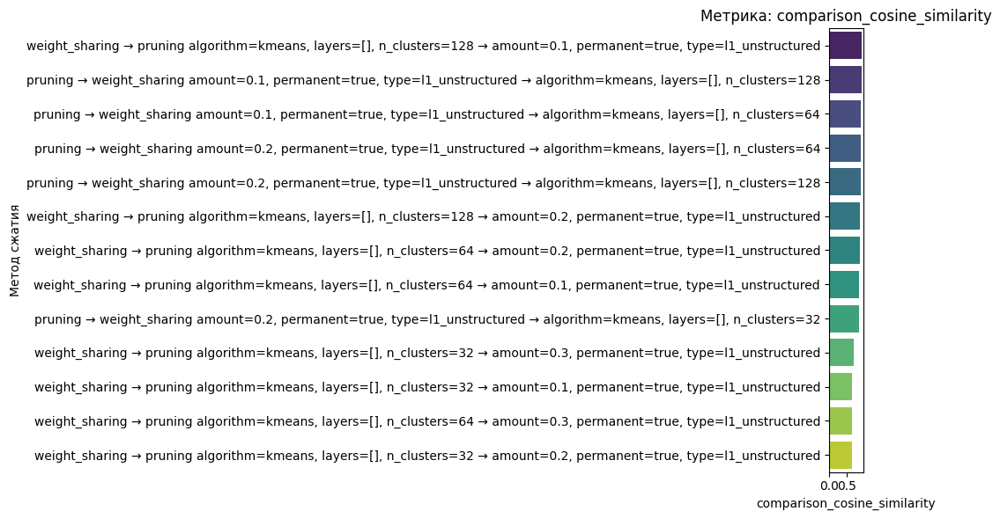

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()


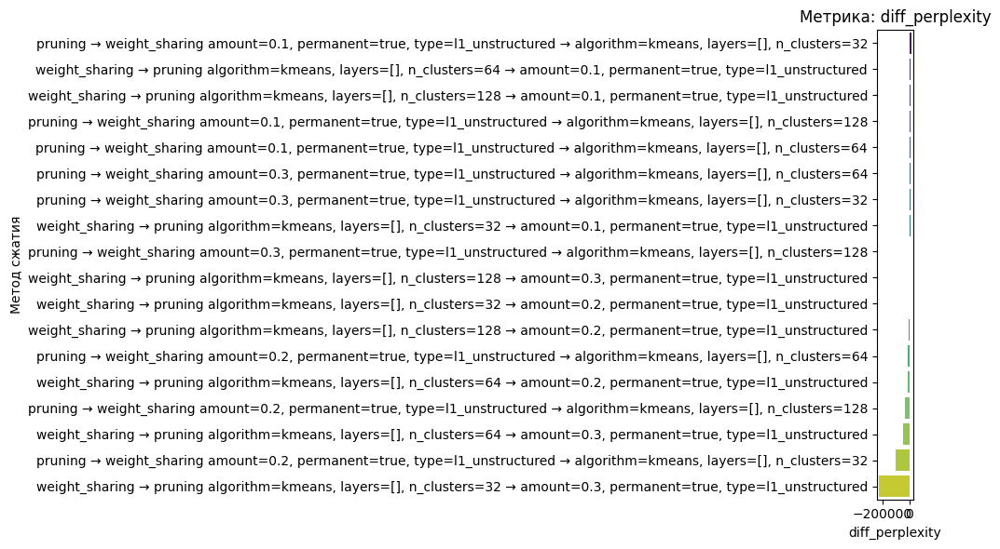


Методы, входящие в топ по всем метрикам для albert-base-v2:
- weight_sharing → pruning algorithm=kmeans, layers=[], n_clusters=64 → amount=0.3, permanent=true, type=l1_unstructured
- weight_sharing → pruning algorithm=kmeans, layers=[], n_clusters=128 → amount=0.1, permanent=true, type=l1_unstructured
- weight_sharing → pruning algorithm=kmeans, layers=[], n_clusters=64 → amount=0.2, permanent=true, type=l1_unstructured
- pruning → weight_sharing amount=0.1, permanent=true, type=l1_unstructured → algorithm=kmeans, layers=[], n_clusters=64
- weight_sharing → pruning algorithm=kmeans, layers=[], n_clusters=32 → amount=0.3, permanent=true, type=l1_unstructured
- weight_sharing → pruning algorithm=kmeans, layers=[], n_clusters=32 → amount=0.1, permanent=true, type=l1_unstructured
- pruning → weight_sharing amount=0.2, permanent=true, type=l1_unstructured → algorithm=kmeans, layers=[], n_clusters=32
- pruning → weight_sharing amount=0.2, permanent=true, type=l1_unstructured → algorithm=kme

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()


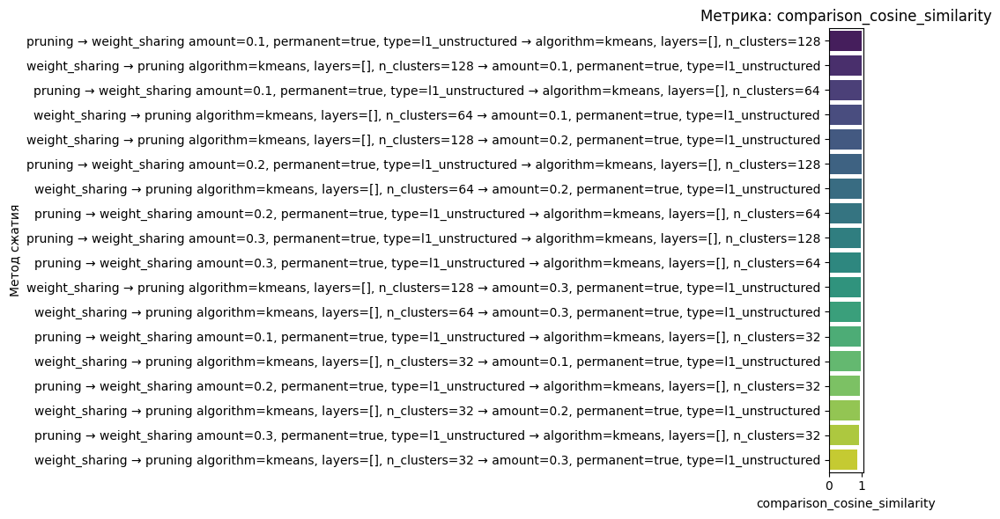

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()


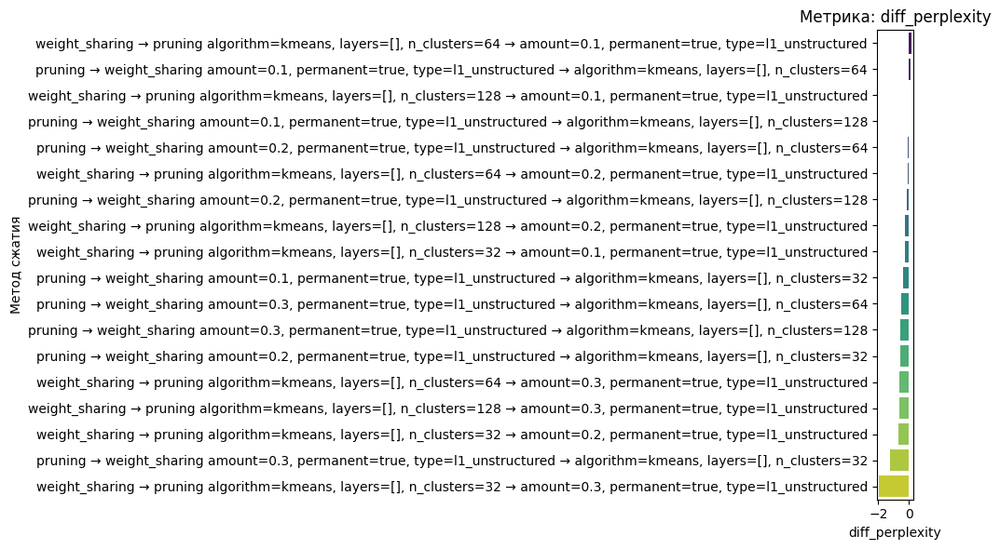


Методы, входящие в топ по всем метрикам для bert-base-uncased:
- weight_sharing → pruning algorithm=kmeans, layers=[], n_clusters=64 → amount=0.3, permanent=true, type=l1_unstructured
- pruning → weight_sharing amount=0.1, permanent=true, type=l1_unstructured → algorithm=kmeans, layers=[], n_clusters=32
- weight_sharing → pruning algorithm=kmeans, layers=[], n_clusters=128 → amount=0.1, permanent=true, type=l1_unstructured
- weight_sharing → pruning algorithm=kmeans, layers=[], n_clusters=64 → amount=0.2, permanent=true, type=l1_unstructured
- pruning → weight_sharing amount=0.1, permanent=true, type=l1_unstructured → algorithm=kmeans, layers=[], n_clusters=64
- pruning → weight_sharing amount=0.3, permanent=true, type=l1_unstructured → algorithm=kmeans, layers=[], n_clusters=64
- pruning → weight_sharing amount=0.3, permanent=true, type=l1_unstructured → algorithm=kmeans, layers=[], n_clusters=128
- pruning → weight_sharing amount=0.3, permanent=true, type=l1_unstructured → algorithm

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()


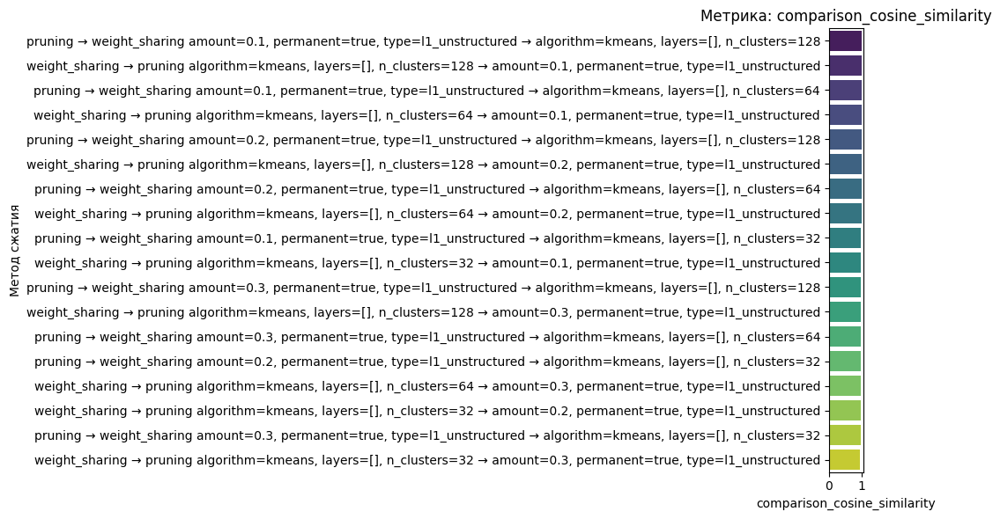

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()


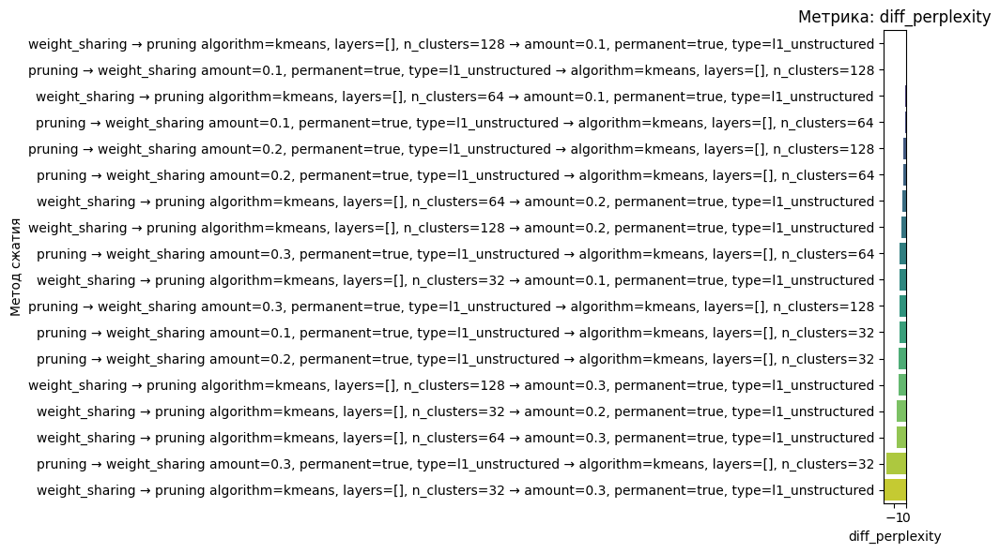


Методы, входящие в топ по всем метрикам для bert-large-uncased:
- weight_sharing → pruning algorithm=kmeans, layers=[], n_clusters=64 → amount=0.3, permanent=true, type=l1_unstructured
- pruning → weight_sharing amount=0.1, permanent=true, type=l1_unstructured → algorithm=kmeans, layers=[], n_clusters=32
- weight_sharing → pruning algorithm=kmeans, layers=[], n_clusters=64 → amount=0.1, permanent=true, type=l1_unstructured
- weight_sharing → pruning algorithm=kmeans, layers=[], n_clusters=128 → amount=0.1, permanent=true, type=l1_unstructured
- weight_sharing → pruning algorithm=kmeans, layers=[], n_clusters=64 → amount=0.2, permanent=true, type=l1_unstructured
- pruning → weight_sharing amount=0.1, permanent=true, type=l1_unstructured → algorithm=kmeans, layers=[], n_clusters=64
- pruning → weight_sharing amount=0.3, permanent=true, type=l1_unstructured → algorithm=kmeans, layers=[], n_clusters=64
- pruning → weight_sharing amount=0.3, permanent=true, type=l1_unstructured → algorithm

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()


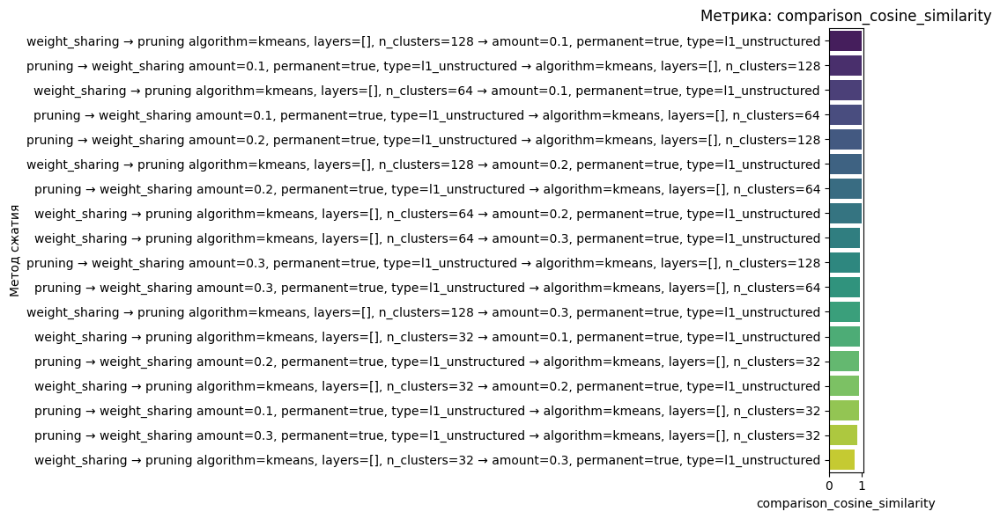

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()


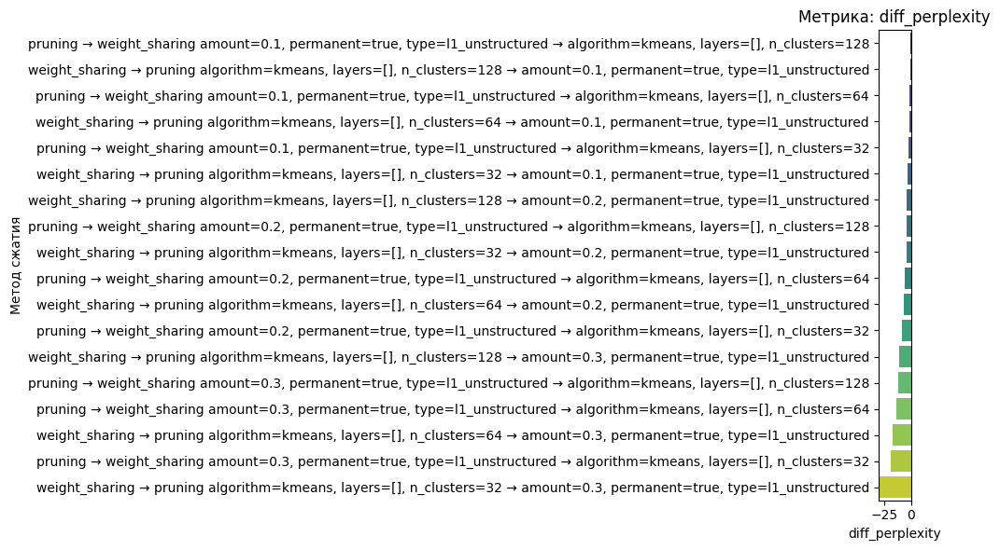

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()



Методы, входящие в топ по всем метрикам для distilbert-base-uncased:
- weight_sharing → pruning algorithm=kmeans, layers=[], n_clusters=64 → amount=0.3, permanent=true, type=l1_unstructured
- pruning → weight_sharing amount=0.1, permanent=true, type=l1_unstructured → algorithm=kmeans, layers=[], n_clusters=32
- weight_sharing → pruning algorithm=kmeans, layers=[], n_clusters=64 → amount=0.1, permanent=true, type=l1_unstructured
- weight_sharing → pruning algorithm=kmeans, layers=[], n_clusters=128 → amount=0.1, permanent=true, type=l1_unstructured
- weight_sharing → pruning algorithm=kmeans, layers=[], n_clusters=64 → amount=0.2, permanent=true, type=l1_unstructured
- pruning → weight_sharing amount=0.1, permanent=true, type=l1_unstructured → algorithm=kmeans, layers=[], n_clusters=64
- pruning → weight_sharing amount=0.3, permanent=true, type=l1_unstructured → algorithm=kmeans, layers=[], n_clusters=128
- pruning → weight_sharing amount=0.3, permanent=true, type=l1_unstructured → alg

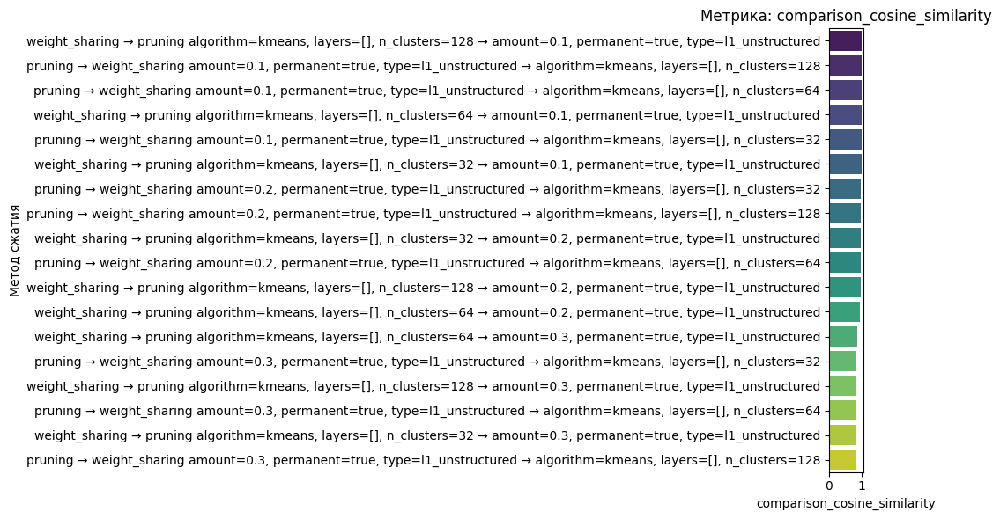

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()


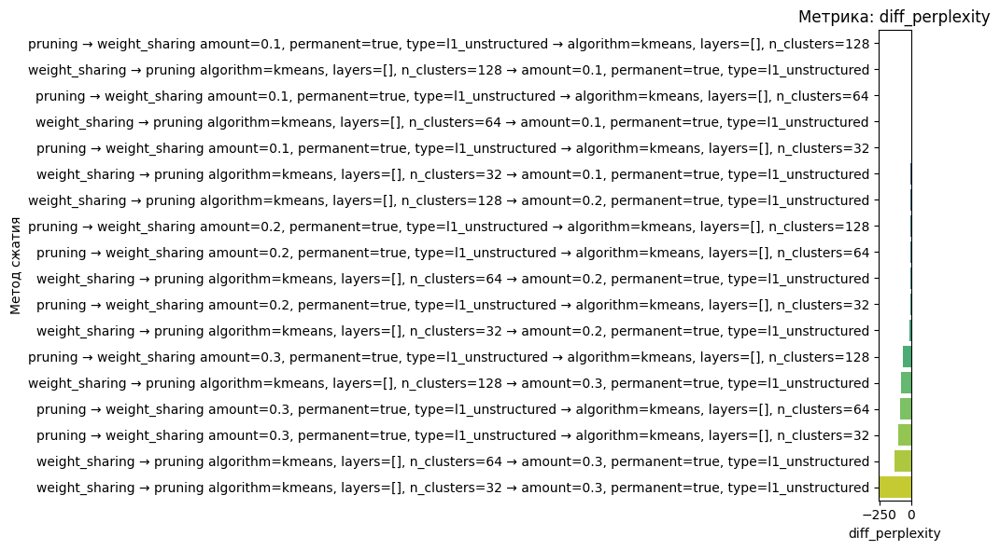


Методы, входящие в топ по всем метрикам для roberta-base:
- weight_sharing → pruning algorithm=kmeans, layers=[], n_clusters=64 → amount=0.3, permanent=true, type=l1_unstructured
- pruning → weight_sharing amount=0.1, permanent=true, type=l1_unstructured → algorithm=kmeans, layers=[], n_clusters=32
- weight_sharing → pruning algorithm=kmeans, layers=[], n_clusters=64 → amount=0.1, permanent=true, type=l1_unstructured
- weight_sharing → pruning algorithm=kmeans, layers=[], n_clusters=128 → amount=0.1, permanent=true, type=l1_unstructured
- weight_sharing → pruning algorithm=kmeans, layers=[], n_clusters=64 → amount=0.2, permanent=true, type=l1_unstructured
- pruning → weight_sharing amount=0.1, permanent=true, type=l1_unstructured → algorithm=kmeans, layers=[], n_clusters=64
- pruning → weight_sharing amount=0.3, permanent=true, type=l1_unstructured → algorithm=kmeans, layers=[], n_clusters=128
- pruning → weight_sharing amount=0.3, permanent=true, type=l1_unstructured → algorithm=kmea

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()


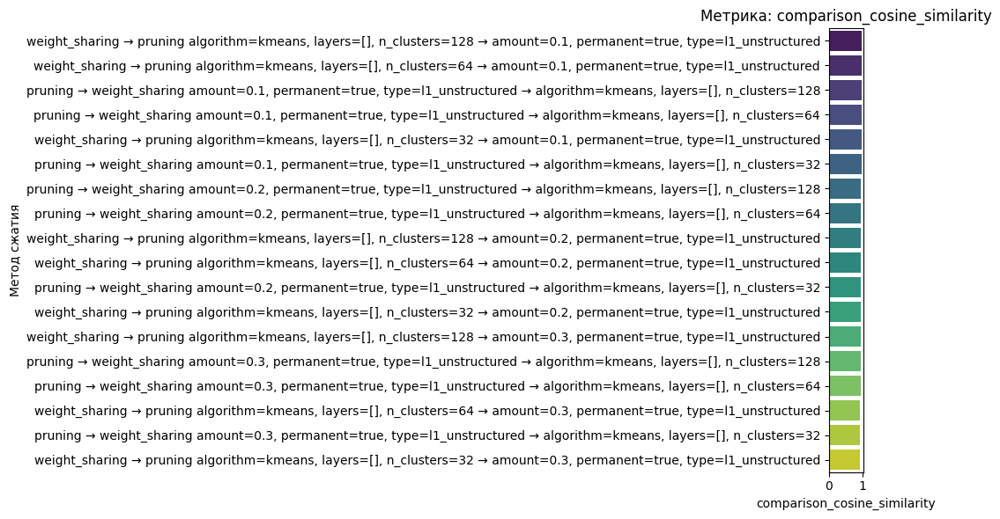

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()


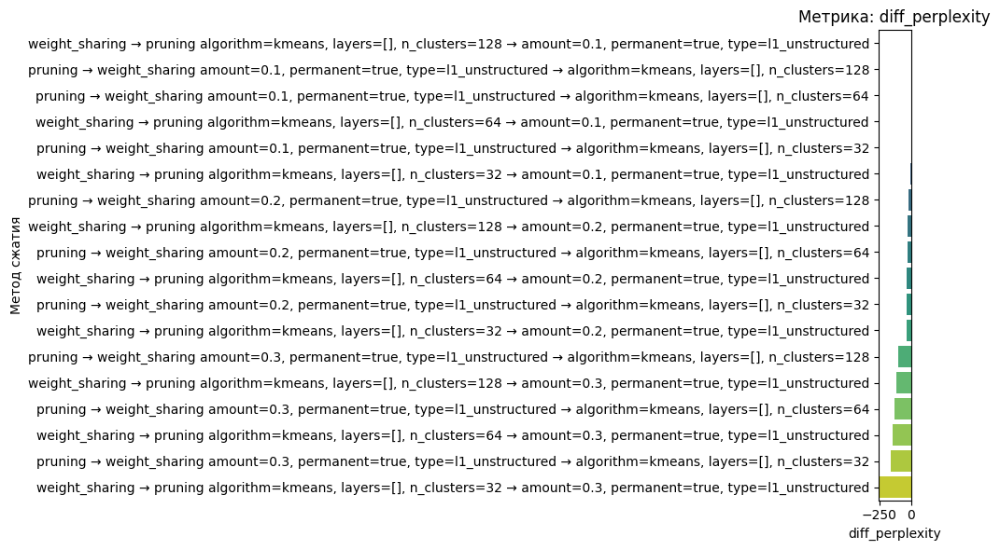


Методы, входящие в топ по всем метрикам для roberta-large:
- weight_sharing → pruning algorithm=kmeans, layers=[], n_clusters=64 → amount=0.3, permanent=true, type=l1_unstructured
- pruning → weight_sharing amount=0.1, permanent=true, type=l1_unstructured → algorithm=kmeans, layers=[], n_clusters=32
- weight_sharing → pruning algorithm=kmeans, layers=[], n_clusters=64 → amount=0.1, permanent=true, type=l1_unstructured
- weight_sharing → pruning algorithm=kmeans, layers=[], n_clusters=128 → amount=0.1, permanent=true, type=l1_unstructured
- weight_sharing → pruning algorithm=kmeans, layers=[], n_clusters=64 → amount=0.2, permanent=true, type=l1_unstructured
- pruning → weight_sharing amount=0.1, permanent=true, type=l1_unstructured → algorithm=kmeans, layers=[], n_clusters=64
- pruning → weight_sharing amount=0.3, permanent=true, type=l1_unstructured → algorithm=kmeans, layers=[], n_clusters=128
- pruning → weight_sharing amount=0.3, permanent=true, type=l1_unstructured → algorithm=kme

In [97]:
type_method = [
    'weight_sharing → pruning',
    'pruning → weight_sharing',
]

method_names = df_avg[df_avg['method_name'].isin(type_method)]['method'].unique()
targets = [
    "comparison_cosine_similarity", 
    "diff_perplexity",
]
top_percents = [1, 1]

count_top = {}
for model_name in df_avg['model'].unique():
    res = compare_compression_methods(df_avg, model_name, method_names, targets, top_percents, 0.6, plot=True)
    for m in res:
        count_top[m] = 1 + count_top.get(m, 0)

print('\nОбщий топ')
top_list = sorted(count_top.items(), key=lambda x: x[1], reverse=True)
for m in top_list:
    print(m)

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()


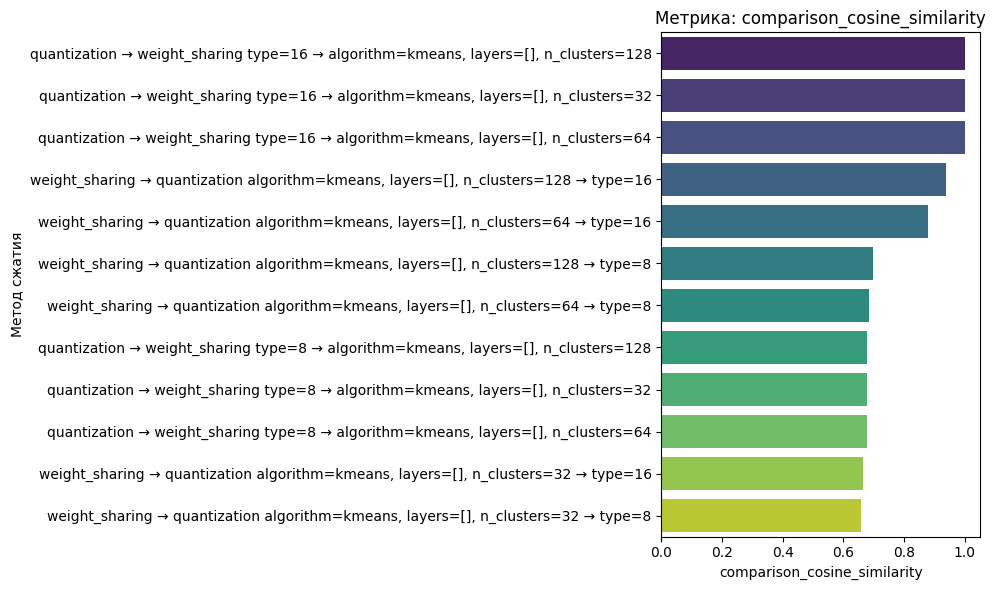

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()


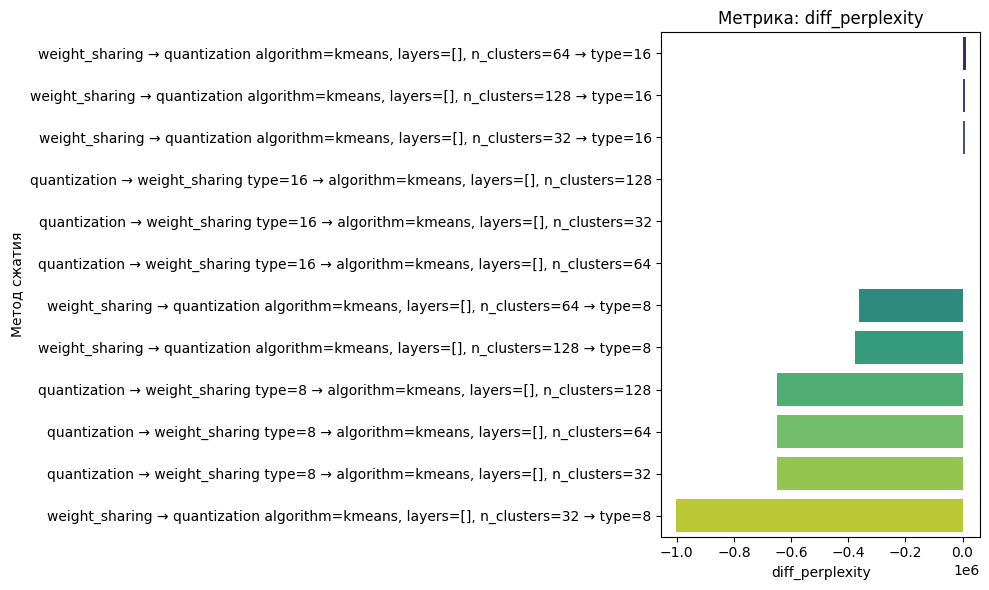

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()



Методы, входящие в топ по всем метрикам для albert-base-v2:
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=32 → type=8
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=128 → type=16
- quantization → weight_sharing type=8 → algorithm=kmeans, layers=[], n_clusters=128
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=32 → type=16
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=128 → type=8
- quantization → weight_sharing type=16 → algorithm=kmeans, layers=[], n_clusters=128
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=64 → type=16
- quantization → weight_sharing type=16 → algorithm=kmeans, layers=[], n_clusters=32
- quantization → weight_sharing type=8 → algorithm=kmeans, layers=[], n_clusters=32
- quantization → weight_sharing type=8 → algorithm=kmeans, layers=[], n_clusters=64
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=64 → type=8
- quan

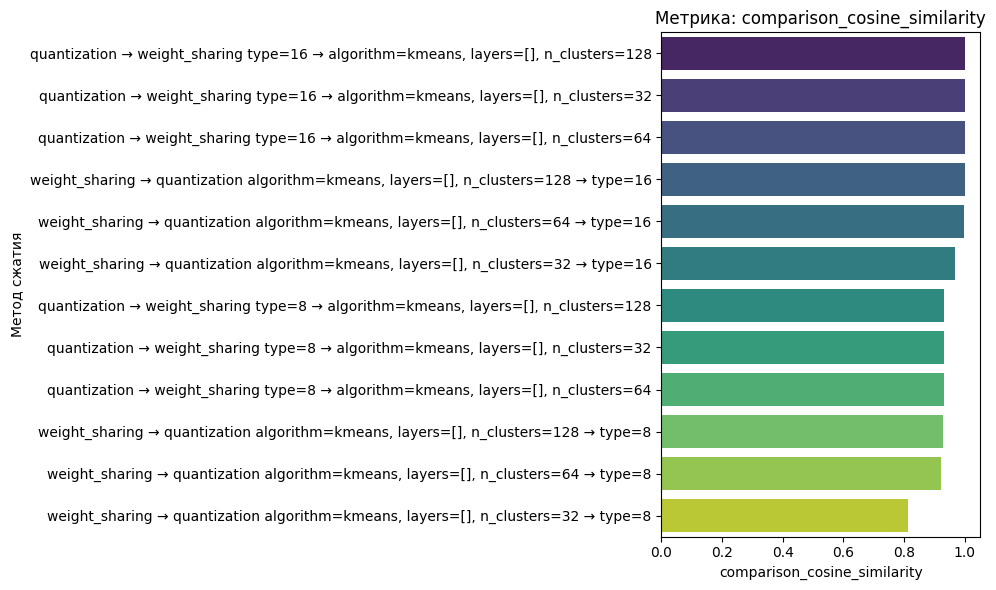

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()


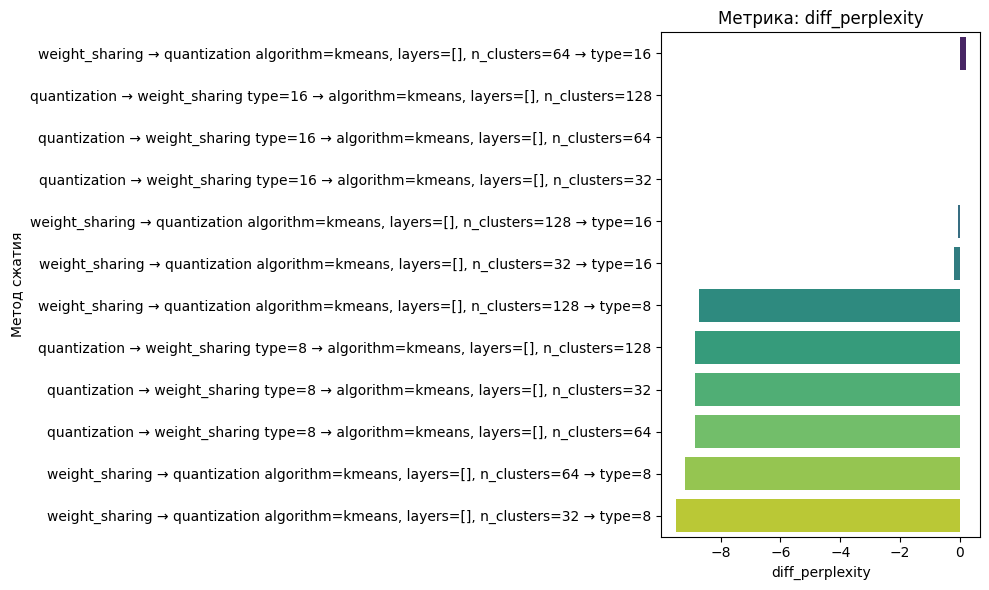

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()



Методы, входящие в топ по всем метрикам для bert-base-uncased:
- quantization → weight_sharing type=8 → algorithm=kmeans, layers=[], n_clusters=32
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=32 → type=8
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=128 → type=16
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=32 → type=16
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=128 → type=8
- quantization → weight_sharing type=16 → algorithm=kmeans, layers=[], n_clusters=128
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=64 → type=16
- quantization → weight_sharing type=16 → algorithm=kmeans, layers=[], n_clusters=32
- quantization → weight_sharing type=8 → algorithm=kmeans, layers=[], n_clusters=64
- quantization → weight_sharing type=8 → algorithm=kmeans, layers=[], n_clusters=128
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=64 → type=8
- q

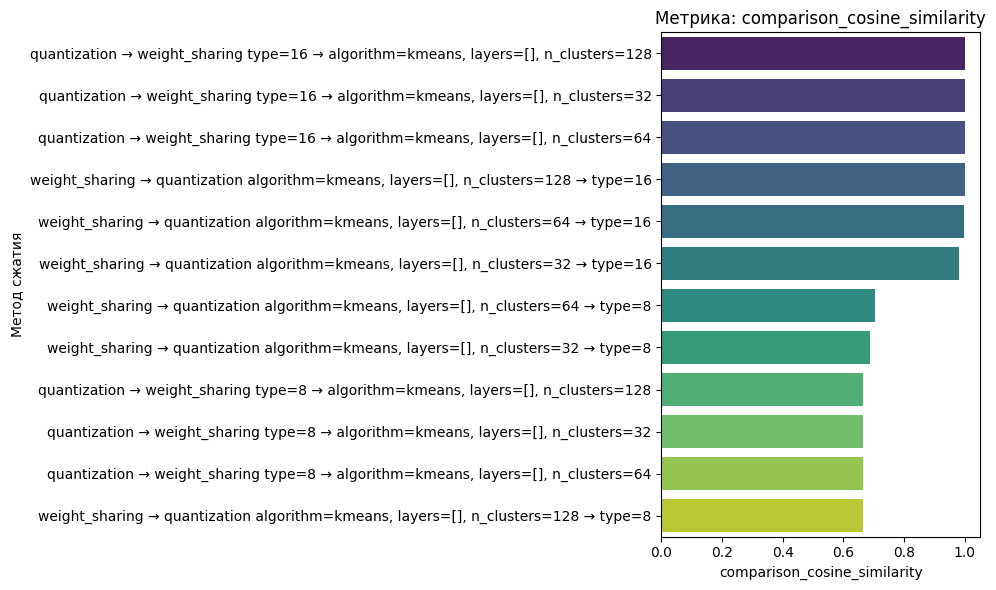

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()


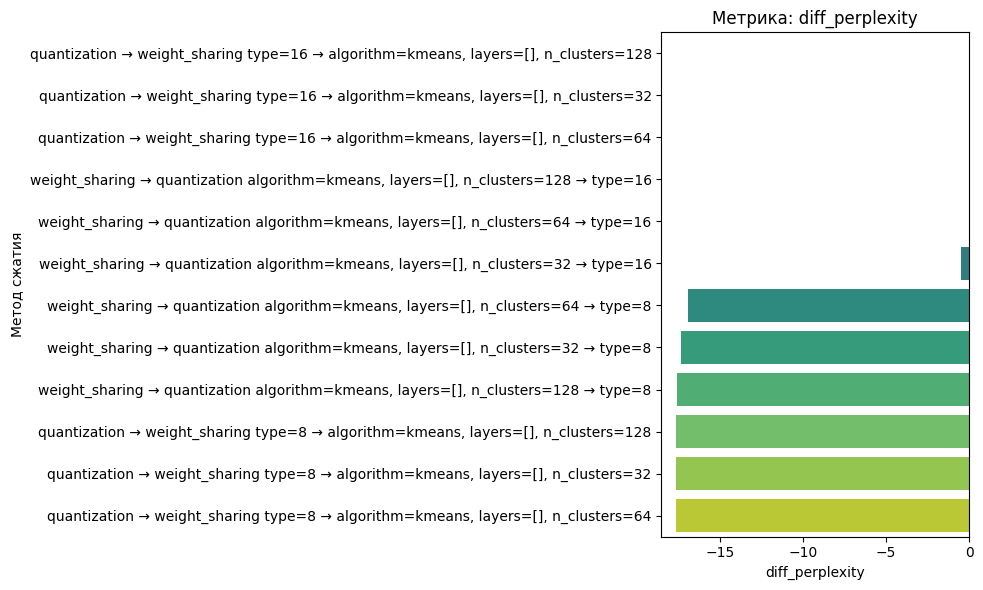

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()



Методы, входящие в топ по всем метрикам для bert-large-uncased:
- quantization → weight_sharing type=8 → algorithm=kmeans, layers=[], n_clusters=32
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=32 → type=8
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=128 → type=16
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=32 → type=16
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=128 → type=8
- quantization → weight_sharing type=16 → algorithm=kmeans, layers=[], n_clusters=128
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=64 → type=16
- quantization → weight_sharing type=16 → algorithm=kmeans, layers=[], n_clusters=32
- quantization → weight_sharing type=8 → algorithm=kmeans, layers=[], n_clusters=64
- quantization → weight_sharing type=8 → algorithm=kmeans, layers=[], n_clusters=128
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=64 → type=8
- 

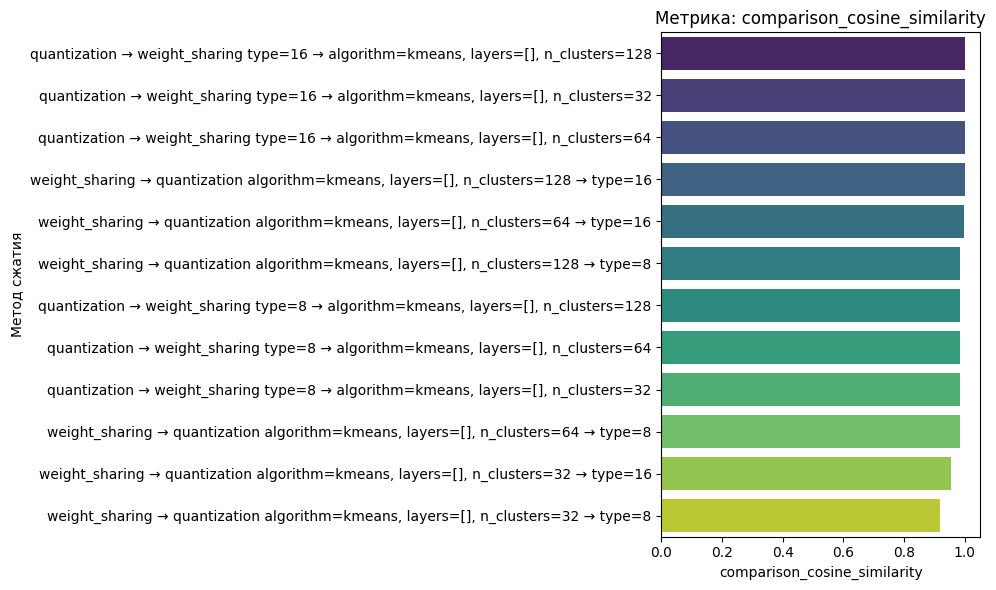

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()


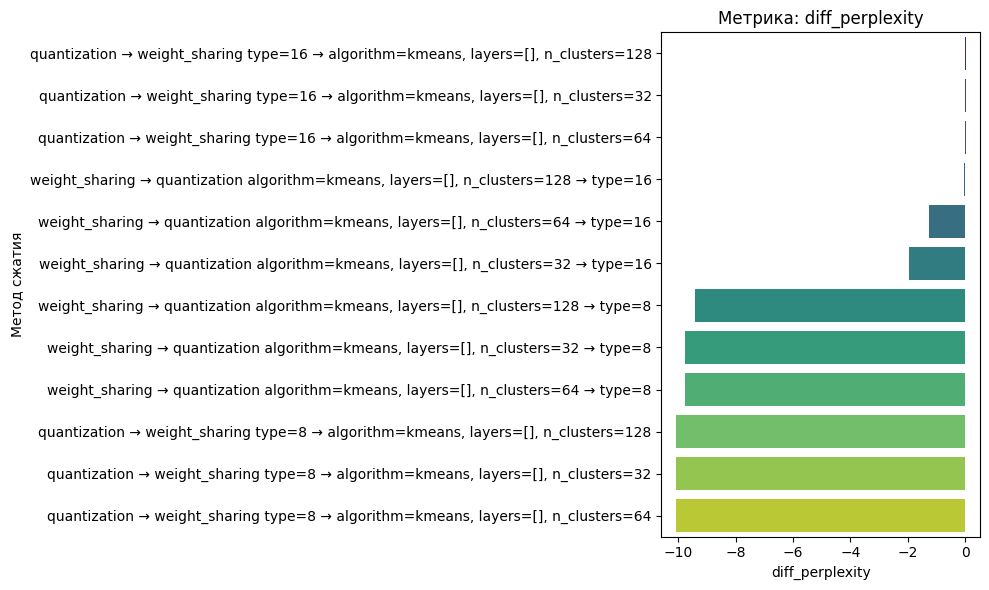

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()



Методы, входящие в топ по всем метрикам для distilbert-base-uncased:
- quantization → weight_sharing type=8 → algorithm=kmeans, layers=[], n_clusters=32
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=32 → type=8
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=128 → type=16
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=32 → type=16
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=128 → type=8
- quantization → weight_sharing type=16 → algorithm=kmeans, layers=[], n_clusters=128
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=64 → type=16
- quantization → weight_sharing type=16 → algorithm=kmeans, layers=[], n_clusters=32
- quantization → weight_sharing type=8 → algorithm=kmeans, layers=[], n_clusters=64
- quantization → weight_sharing type=8 → algorithm=kmeans, layers=[], n_clusters=128
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=64 → type

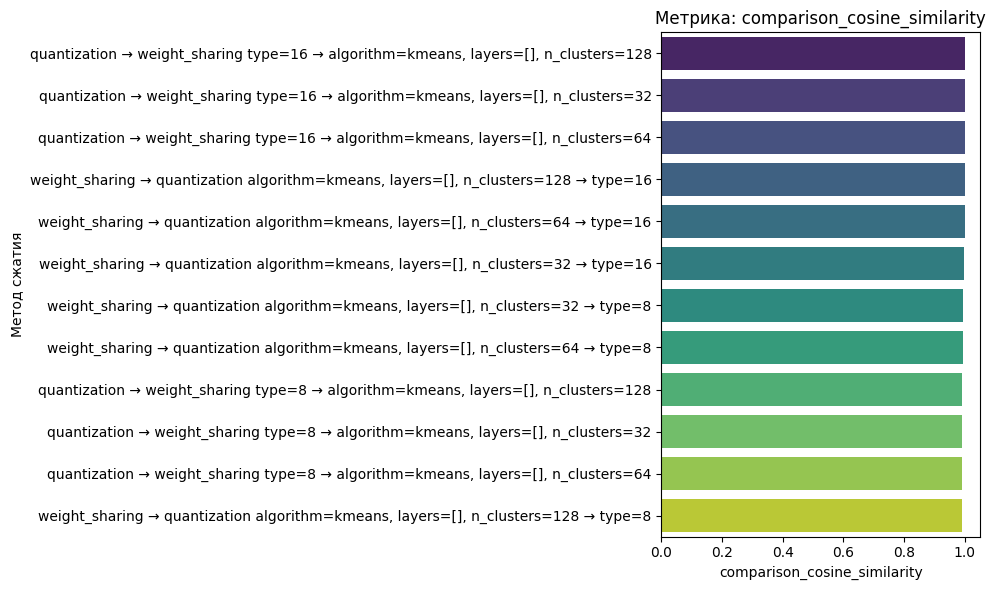

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()


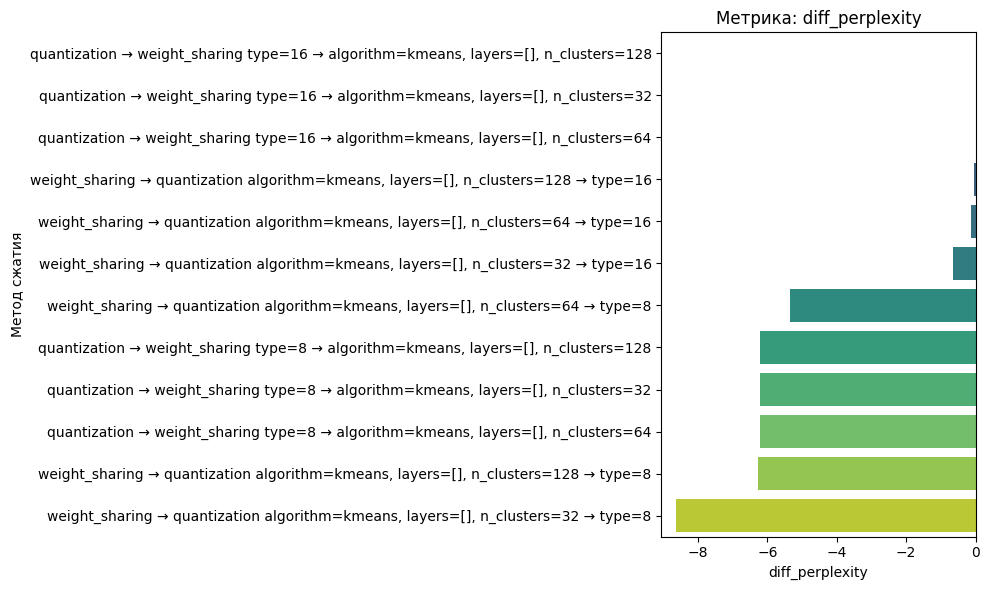

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()



Методы, входящие в топ по всем метрикам для roberta-base:
- quantization → weight_sharing type=8 → algorithm=kmeans, layers=[], n_clusters=32
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=32 → type=8
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=128 → type=16
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=32 → type=16
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=128 → type=8
- quantization → weight_sharing type=16 → algorithm=kmeans, layers=[], n_clusters=128
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=64 → type=16
- quantization → weight_sharing type=16 → algorithm=kmeans, layers=[], n_clusters=32
- quantization → weight_sharing type=8 → algorithm=kmeans, layers=[], n_clusters=64
- quantization → weight_sharing type=8 → algorithm=kmeans, layers=[], n_clusters=128
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=64 → type=8
- quanti

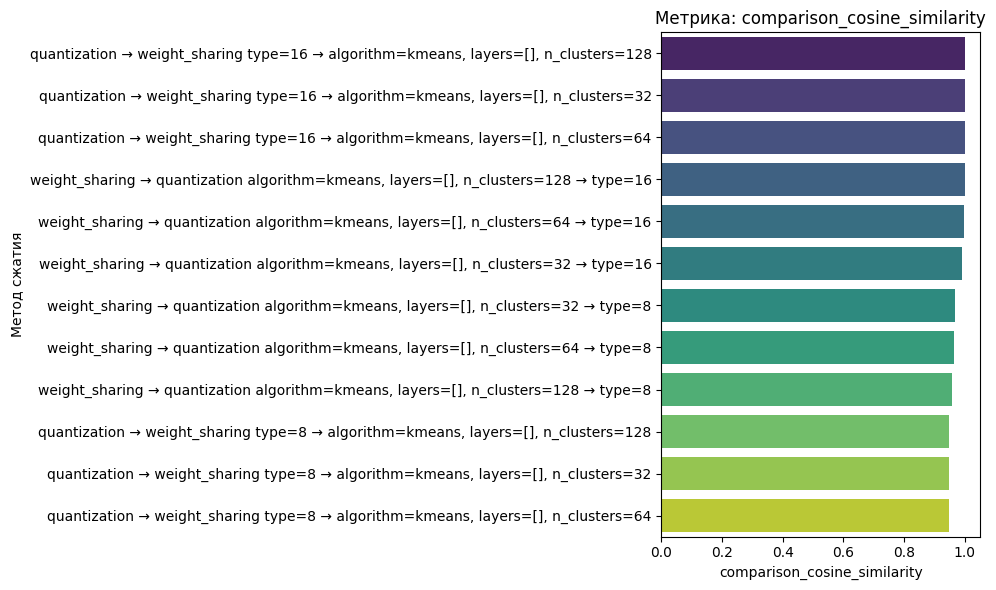

/tmp/ipykernel_12096/1209688537.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()


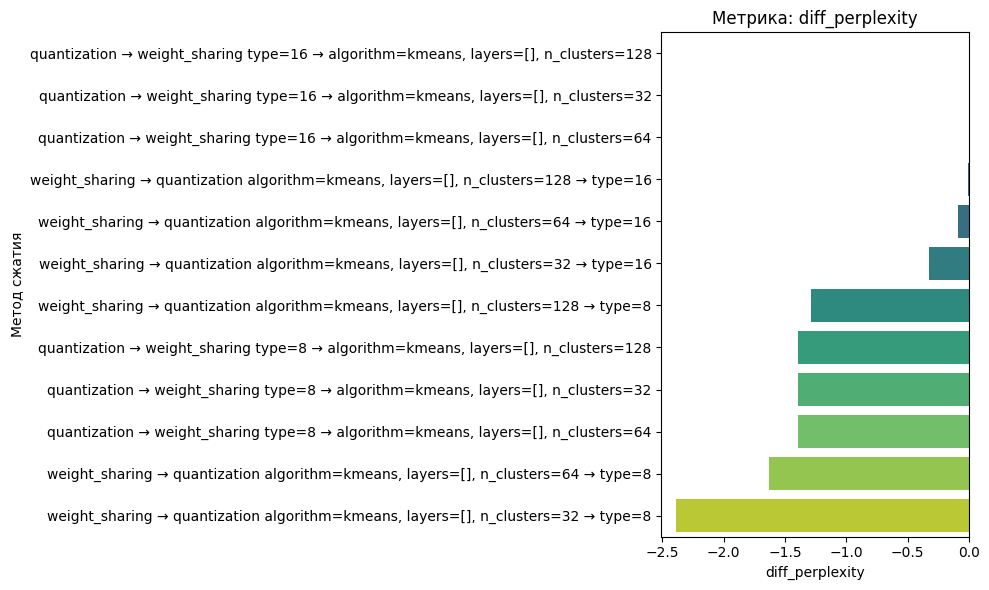


Методы, входящие в топ по всем метрикам для roberta-large:
- quantization → weight_sharing type=8 → algorithm=kmeans, layers=[], n_clusters=32
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=32 → type=8
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=128 → type=16
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=32 → type=16
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=128 → type=8
- quantization → weight_sharing type=16 → algorithm=kmeans, layers=[], n_clusters=128
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=64 → type=16
- quantization → weight_sharing type=16 → algorithm=kmeans, layers=[], n_clusters=32
- quantization → weight_sharing type=8 → algorithm=kmeans, layers=[], n_clusters=64
- quantization → weight_sharing type=8 → algorithm=kmeans, layers=[], n_clusters=128
- weight_sharing → quantization algorithm=kmeans, layers=[], n_clusters=64 → type=8
- quant

In [98]:
type_method = [
    'weight_sharing → quantization',
    'quantization → weight_sharing'
]
method_names = df_avg[df_avg['method_name'].isin(type_method)]['method'].unique()
targets = [
    "comparison_cosine_similarity", 
    "diff_perplexity",
]
top_percents = [1, 1]

count_top = {}
for model_name in df_avg['model'].unique():
    res = compare_compression_methods(df_avg, model_name, method_names, targets, top_percents, -1, plot=True)
    for m in res:
        count_top[m] = 1 + count_top.get(m, 0)

print('\nОбщий топ')
top_list = sorted(count_top.items(), key=lambda x: x[1], reverse=True)
for m in top_list:
    print(m)



## Scatterplot

In [162]:
df_avg = get_df_avg(df)
columns = [
    'filename', 
    'seed',
    *[x for x in df_avg.columns if ('compressed' in x) or ('baseline' in x)]
]
df_avg.drop(columns=columns, inplace=True)
print(df_avg.shape)
df_avg.head(2)

(404, 11)


,model,method_name,method,comparison_cosine_similarity,comparison_mse,diff_size,diff_perplexity,diff_latency,diff_total_params,diff_sparsity,diff_unique_weights
4,albert-base-v2,pruning,"amount=0.1, permanent=true, type=l1_unstructured",0.948862,0.175840,0.0,7805.196823,0.001677,0.0,-0.099045,0.0
71,bert-base-uncased,pruning,"amount=0.1, permanent=true, type=l1_unstructured",0.999048,0.000472,0.0,0.025391,0.000516,0.0,-0.099499,0.0


In [183]:
def plot_scatter_matrix(df, columns_to_plot, color='method_name'):
    # Генерируем все возможные пары столбцов
    pairs = list(itertools.combinations(columns_to_plot, 2))
    n_pairs = len(pairs)
    
    # Определяем размер сетки для subplots
    n_cols = 3
    n_rows = (n_pairs + n_cols - 1) // n_cols
    
    # Создаем фигуру с несколькими subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*6, n_rows*5))
    axes = axes.flatten()  # Преобразуем в плоский массив для удобства
    
    # Создаем scatterplot для каждой пары
    for i, (x_col, y_col) in enumerate(pairs):
        ax = axes[i]
        sns.scatterplot(data=df, x=x_col, y=y_col, hue=color, palette='viridis', 
                        alpha=0.7, ax=ax)
        
        # Добавляем заголовок и подписи
        ax.set_title(f'{x_col} vs {y_col}')
        ax.set_xlabel(x_col)
        ax.set_ylabel(y_col)
        
        # Добавляем легенду
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # Скрываем лишние subplots, если они есть
    for j in range(i+1, len(axes)):
        axes[j].axis('off')
    
    plt.tight_layout()
    plt.show()

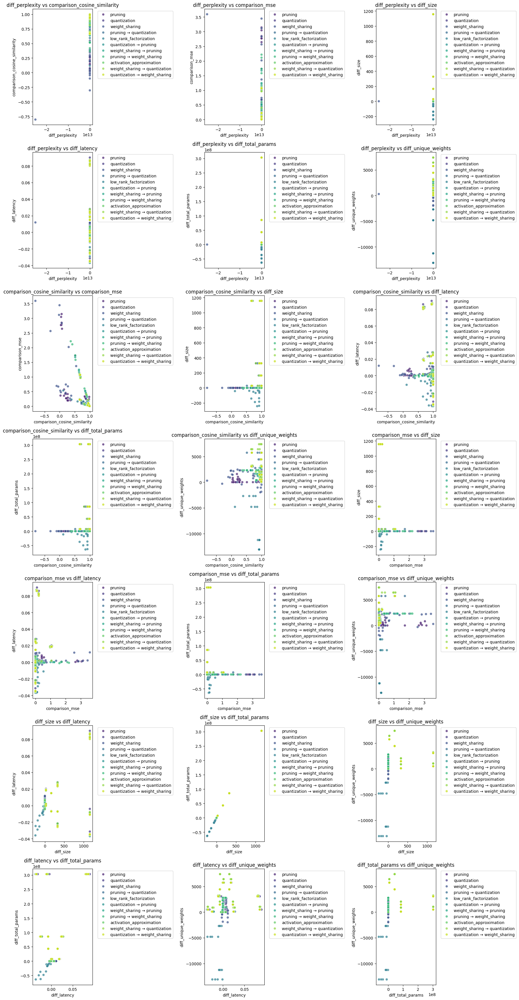

In [184]:
targets = [
    'diff_perplexity',
    'comparison_cosine_similarity',
    'comparison_mse',
    'diff_size',
    'diff_latency',
    'diff_total_params',
    'diff_unique_weights'
]
plot_scatter_matrix(df_avg, targets)

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


def plot_original_vs_pca(df, original_column, color_column='method_name', random_state=42):
    """
    Строит scatterplot, где:
    - x-axis: исходная колонка (без изменений)
    - y-axis: PC1 от всех остальных числовых колонок
    - цвет точек определяется color_column
    
    Параметры:
    ----------
    df : pandas.DataFrame
        Входной DataFrame
    original_column : str
        Название колонки для оси X (остается без изменений)
    color_column : str, optional
        Колонка для цветового кодирования точек (по умолчанию 'method_name')
    random_state : int, optional
        Random state для воспроизводимости (по умолчанию 42)
    """
    # Проверка наличия необходимых колонок
    if original_column not in df.columns:
        raise ValueError(f"Колонка {original_column} не найдена в DataFrame")
    if color_column not in df.columns:
        raise ValueError(f"Колонка {color_column} не найдена в DataFrame")
    
    # Выбираем все числовые колонки кроме original_column
    numeric_cols = df.select_dtypes(include=['number']).columns
    numeric_cols = [col for col in numeric_cols if col != original_column]
    
    if not numeric_cols:
        raise ValueError("Нет числовых колонок для PCA преобразования")
    
    # Масштабируем данные для PCA
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(df[numeric_cols])
    
    # Применяем PCA (берем только первую компоненту)
    pca = PCA(n_components=1, random_state=random_state)
    pca_result = pca.fit_transform(scaled_data)
    
    # Создаем DataFrame для построения графика
    plot_df = pd.DataFrame({
        original_column: df[original_column],
        'PCA (other features)': pca_result.flatten(),
        color_column: df[color_column]
    })
    
    # Строим scatterplot
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=plot_df, x=original_column, y='PCA (other features)', 
                    hue=color_column, palette='viridis', alpha=0.7)
    
    plt.title(f'Scatterplot: {original_column} vs PCA (other features)')
    plt.xlabel(original_column)
    plt.ylabel('First PCA component (other features)')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # Выводим информацию о PCA
    print(f"Объясненная дисперсия PC1: {pca.explained_variance_ratio_[0]:.1%}")
    
    plt.tight_layout()
    plt.show()
    
    return plot_df

Объясненная дисперсия PC1: 35.6%


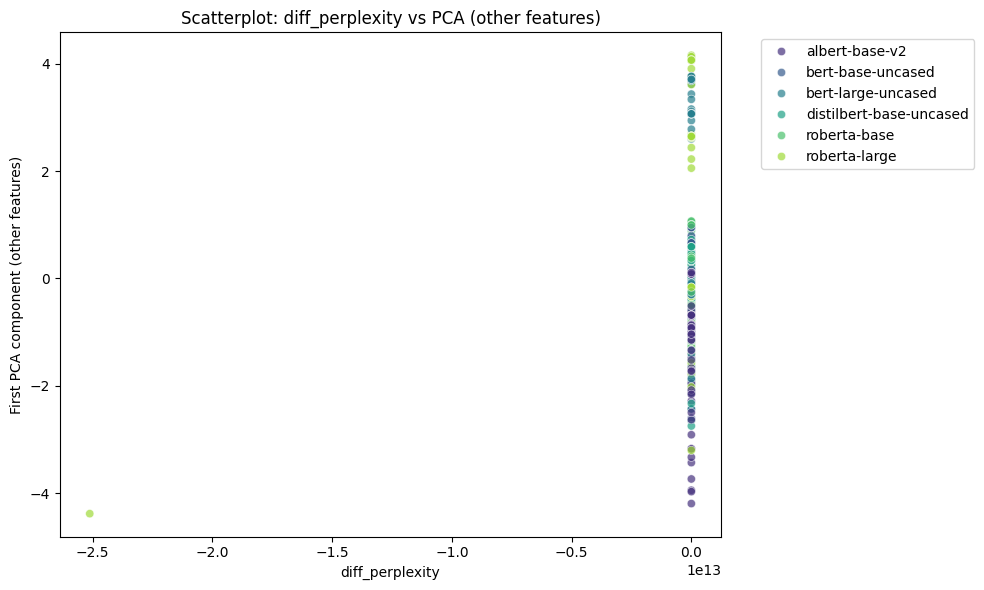

Объясненная дисперсия PC1: 33.9%


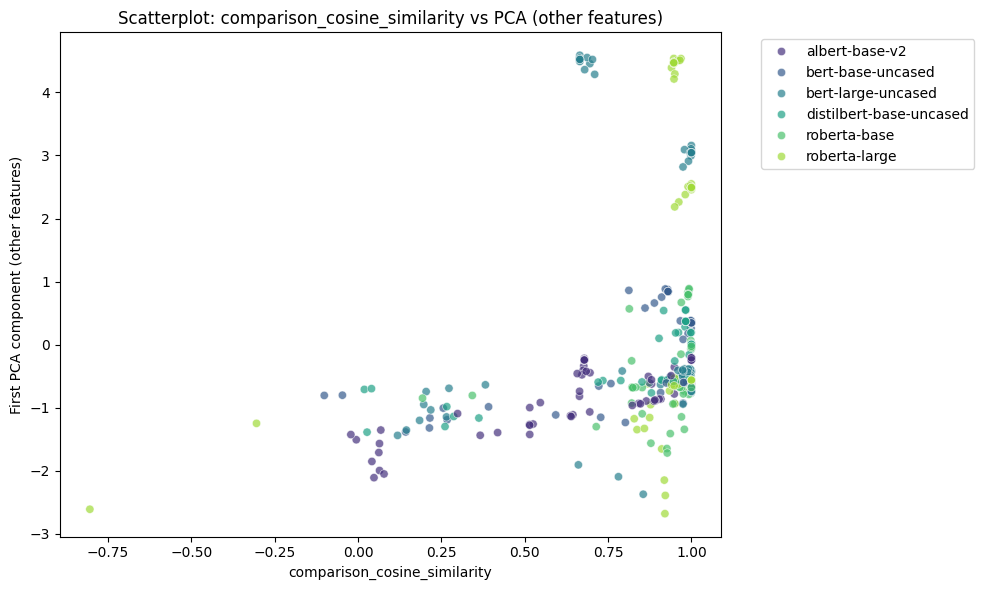

Объясненная дисперсия PC1: 33.9%


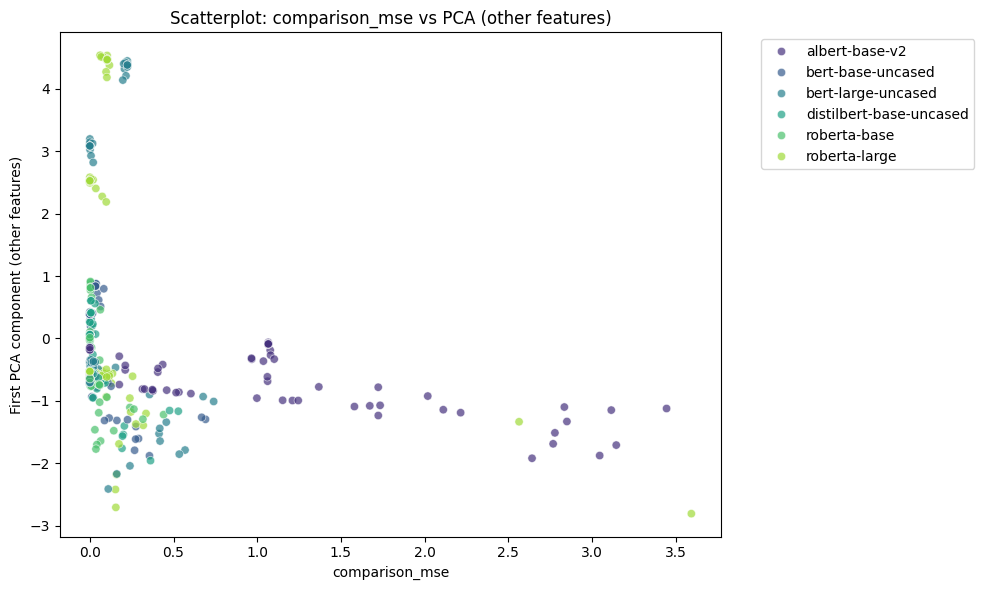

Объясненная дисперсия PC1: 31.4%


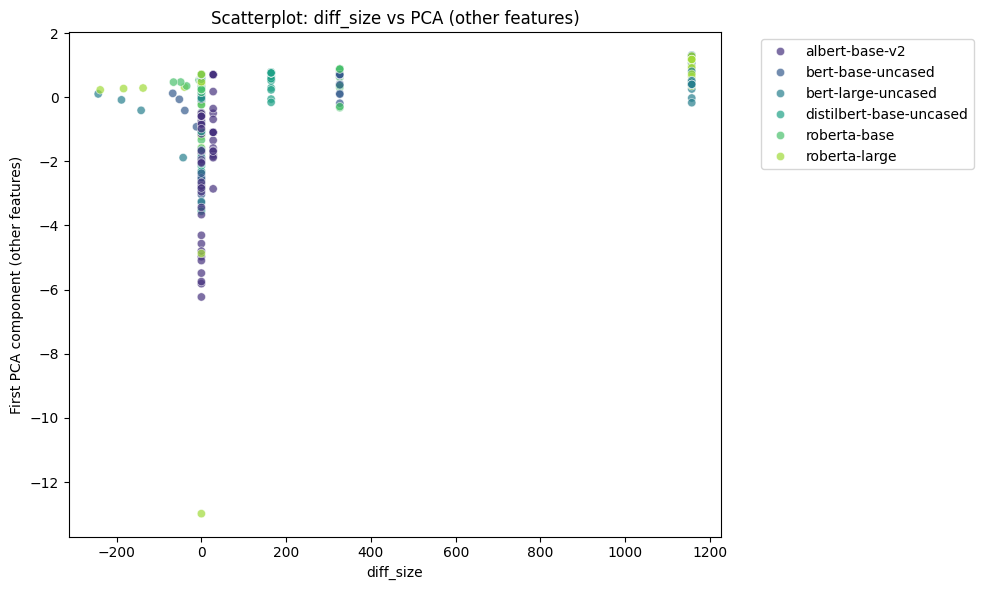

Объясненная дисперсия PC1: 34.7%


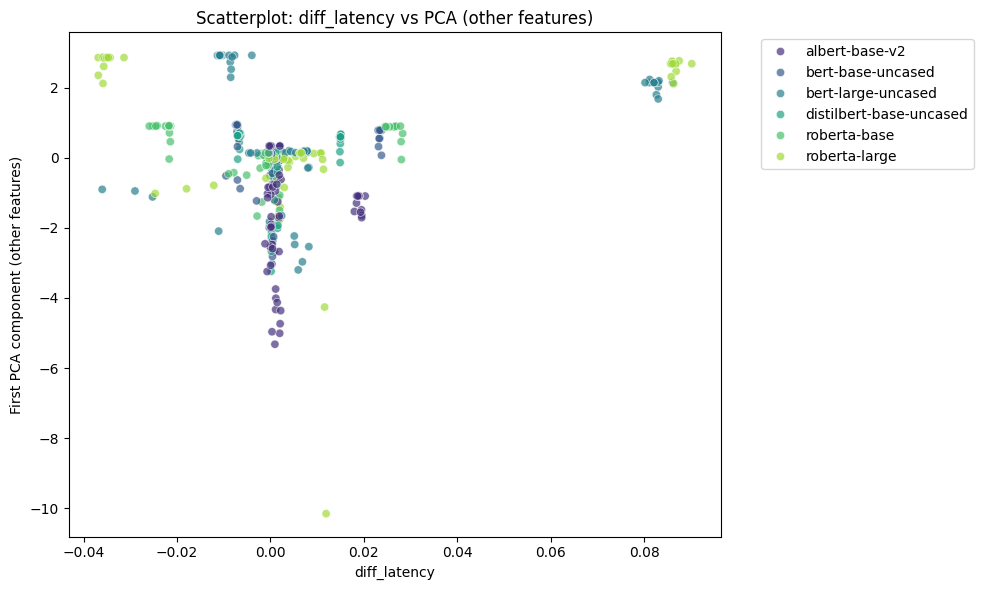

Объясненная дисперсия PC1: 31.4%


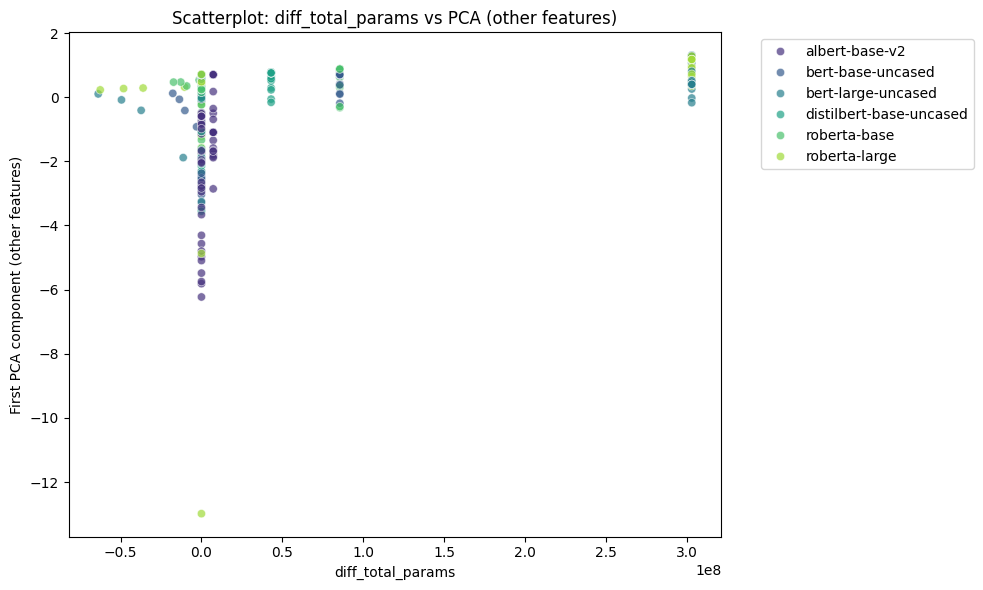

Объясненная дисперсия PC1: 35.9%


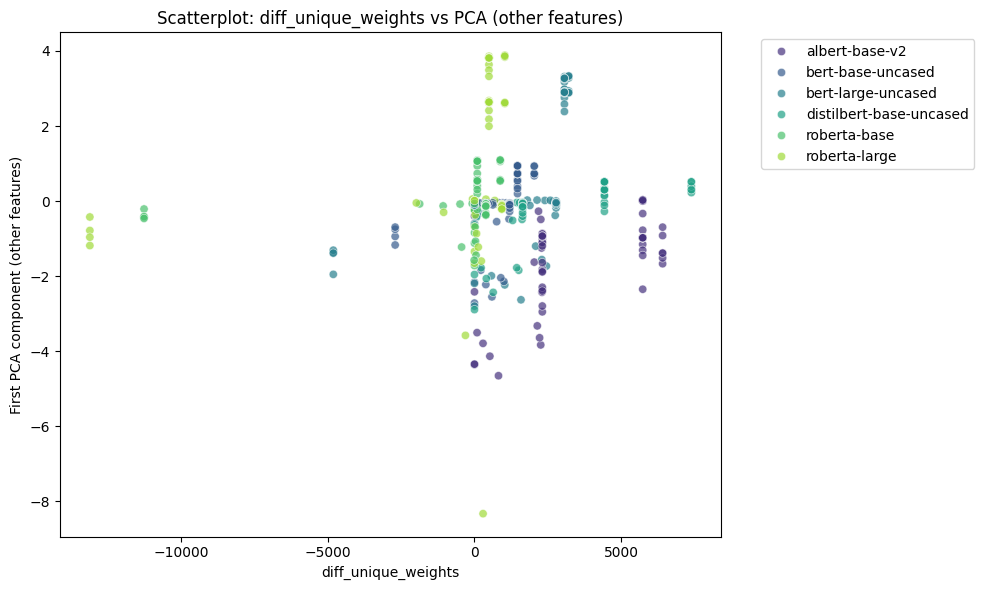

In [217]:
for column in targets:
    result = plot_original_vs_pca(df_avg, original_column=column, color_column='model')

